1.  For each selected keypoint, test for rotation and also removal of RGB values. 
2. Although direct comparisons of probability distribuitions using metrics like KL and Shannon Divergence are not applicable in semantic correspondence usually,we can actually use them by comparing the probability distribuition of *source attention* and *target-to-source* attention.
3. Test for the KL divergence between the distribuition of the neighbors of the selected keypoint and the the distribuition of the selected keypoint. This might reveal important information about the quality of the keypoint.  

## Understanding the aims of the research 

We aim to establish correspondences and perform feature matching between two images, $I_s$ and $I_t$ using SD2. In particular, we utilize cross self-attention maps in T2I diffusion models to define **Inverse Mapping Score**. In this notebook, we take the middle layers of U-Net to test our approach. Given the source image and target image, we pass through DDIM inversion step t = 1.  

Let $ Q_s \in \mathbb{R}^{H \times D \times N} $ represent the query matrix for the source image, where $H$ is the number of attention heads, $D$ is the feature dimension per head, and $ N $ is the number of spatial tokens. Similarly, let $ K_s \in \mathbb{R}^{H \times D \times N} $ and $ K_t \in \mathbb{R}^{H \times D \times N} $ denote the key matrices for the source and target images, respectively. The self-attention map $ A_{\text{self}} $ is computed as:
$$ 
A_{\text{self}} = \text{softmax}\left(\frac{Q_s \cdot K_s^T}{\sqrt{D}}\right), \quad A_{\text{self}} \in \mathbb{R}^{H \times N \times N},
$$ 

and the cross self-attention map from source to target $ A_{\text{stg}} $ is computed as:
$$ A_{\text{stg}} = \text{softmax}\left(\frac{Q_s \cdot K_t^T}{\sqrt{D}}\right), \quad A_{\text{stg}} \in \mathbb{R}^{H \times N \times N} $$ 

Furthermore, the cross self-attention map from target to source $ A_{\text{tts}} $ are computed as: 
$$ A_{\text{tts}} = \text{softmax}\left(\frac{Q_t \cdot K_s^T}{\sqrt{D}}\right), \quad A_{\text{tts}} \in \mathbb{R}^{H \times N \times N} $$ 

Using these, we define Inverse mapping score which evaluates how well a transformation from a source domain to a target domain preserves spatial relationships when mapped back to the source domain. Given a mapping $f: S \rightarrow T$ that transforms a soruce coordiante $x_s$ to a target coordinate $x_t$, the inverse mapping function $g: T \rightarrow S $ attempts to map $x_t$ back to $x_s'$. The error in reconstruction is given by:

$$
d(x_s, x_s') = \| x_s - g(f(x_s)) \|
$$

where $x_s$ is the original point in the **source domain**, $x_t = f(x_s)$ is the corresponding mapped point in the **target domain**, and $x_s' = g(x_t)$ is the reconstructed source point from the target mapping. The **Inverse Mapping Score (IMS)** can be defined as:

$$
IMS = \frac{1}{N} \sum_{i=1}^{N} d(x_s^i, x_s'^i)
$$

where $N$ is the total number of points. In order to get a measure of $d(x_s, x_s')$ in context of self-attention maps, we first compute $A_{sst}$ and $A_{tts}$. We then average across heads: 

$$ 
\bar{A}_{\text{self}} = \frac{1}{H} \sum_{h=1}^{H} A_{\text{self}}^{(h)}, \quad \bar{A}_{\text{stg}} = \frac{1}{H} \sum_{h=1}^{H} A_{\text{stg}}^{(h)},\quad \bar{A}_{\text{ttg}} = \frac{1}{H} \sum_{h=1}^{H} A_{\text{ttg}}^{(h)}
$$ 
where $ \bar{A}_{\text{self}} $ and $ \bar{A}_{\text{cross}} $ are of dimension $ \mathbb{R}^{N \times N} $. The spatial dimension $ N $,  equals 1024 in the middle layer of the U-Net. This is partitioned into an $ 32 \times 32 $ grid. Each grid cell corresponds to a 
submatrix of size $ 32 \times 32 $ (since $ 1024 / 32 = 32 $). Thus, $ \bar{A}_{\text{self}} $ is partitioned as $A[i,j, x, y]$. A similar partitioning is performed for 
$ \bar{A}_{\text{stg}} $. Each submatrix $ A_{x,y} $ is then normalized along its rows as follows:
$$ 
\tilde{A}_{i,j} = \frac{A_{i,j}}{\sum_{k=1}^{32} A_{i,j}(k,:)}, \quad \tilde{A}_{i,j} \in \mathbb{R}^{32 \times 32}.
$$ 


Given this formulation, we can express the metric $d(x_s, x_s')$ as following: 

$$
d(x_s, x_s') = \| x_s - A_{tts}(A_{sst}(x_s)) \|
$$

Another quantity of interest is **Inverse mapping entropy**. This is used to quantify the uncertainty in the inverse mapping process. Given a probability distribution $ P(S_i | T_j)$ that represents the likelihood of a source coordinate $S_i$ mapping back from a target coordinate $T_j$, the Inverse Mapping Entropy is computed as:

$$
H(T_j) = - \sum_{i} P(S_i | T_j) \log P(S_i | T_j)
$$

where $P(S_i | T_j)$ is the probability of source location $S_i$ being the correct inverse mapping of target location $T_j$. If a target point $T_j$ maps back to a single, well-defined source $S_i$ with high probability (i.e., $P(S_i | T_j) \approx 1 $), the entropy is \textbf{low}, meaning the mapping is \textbf{deterministic}. If a target point $T_j$ maps back to multiple sources $S_i$ with nearly equal probabilities, the entropy is \textbf{high}, meaning the mapping is \textbf{uncertain and diffuse}.

If a single target receives too many mappings, it may be an \textbf{overloaded point} (a collapse error). To acocunt for this, we use mapping density. We simply count how many times a target appears.

$$
MD(y) = \sum 1(Tgt \rightarrow Src = y)
$$
where $1$ is an indicator function that counts occurrences of $y$. High $MD(y)$ indicates too many inputs mapping to one point (possible issue) and low $MD(y)$ indicates that the target is sparsely mapped (more likely to be valid).  

Finally, we can combine mapping density and entropy to compute NIMs. 


$$
NIMS(y) = \frac{IME(y)}{\log MD(y)}
$$

wher $IME(y)$ captures the **diversity** of sources mapping to $y$ and $MD(y)$ accounts for how **overloaded** the target is.  A high $NIMS(y)$ indicates that many sources mapping evenly (good distribution) while a Low $NIMS(y)$ indicate many sources collapsing into one target (bad).  

-- 

The progress highlights my approach so far of finding keypoints across $I_s$ and $I_t$

 


In [1]:
!pip install huggingface_hub==0.25.1
!pip install "jax[cuda12_local]==0.4.23" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
!pip install diffusers==0.17.1

!pip install requests==2.27.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 436.4/436.4 kB 11.3 MB/s eta 0:00:0000:01
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 0.28.1
    Uninstalling huggingface-hub-0.28.1:
      Successfully uninstalled huggingface-hub-0.28.1
Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.8/131.8 MB 13.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 34.9 MB/s eta 0:00:0000:01
  Attempting uninstall: jaxlib
    Found existing installation: jaxlib 0.4.33
    Uninstalling jaxlib-0.4.33:
      Successfully uninstalled jaxlib-0.4.33
  Attempting uninstall: jax
    Found existing installation: jax 0.4.33
    Uninstalling jax-0.4.33:
      Successfully uninstalled jax-0.4.33
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency 

In [2]:
from typing import Optional, Union, Tuple, List, Callable, Dict
from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
import torch.nn.functional as nnf
import numpy as np
import abc
import shutil
from torch.optim.adam import Adam
from PIL import Image

/usr/local/lib/python3.10/dist-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.20) or chardet (5.2.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

# Attention_Control 

In [3]:
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
import cv2
from typing import Optional, Union, Tuple, List, Callable, Dict
from IPython.display import display
from tqdm.notebook import tqdm



    
def get_word_inds(text: str, word_place: int, tokenizer):
    split_text = text.split(" ")
    if type(word_place) is str:
        word_place = [i for i, word in enumerate(split_text) if word_place == word]
    elif type(word_place) is int:
        word_place = [word_place]
    out = []
    if len(word_place) > 0:
        words_encode = [tokenizer.decode([item]).strip("#") for item in tokenizer.encode(text)][1:-1]
        cur_len, ptr = 0, 0

        for i in range(len(words_encode)):
            cur_len += len(words_encode[i])
            if ptr in word_place:
                out.append(i + 1)
            if cur_len >= len(split_text[ptr]):
                ptr += 1
                cur_len = 0
    return np.array(out)


def update_alpha_time_word(alpha, bounds: Union[float, Tuple[float, float]], prompt_ind: int,
                           word_inds: Optional[torch.Tensor]=None):
    if type(bounds) is float:
        bounds = 0, bounds
    start, end = int(bounds[0] * alpha.shape[0]), int(bounds[1] * alpha.shape[0])
    if word_inds is None:
        word_inds = torch.arange(alpha.shape[2])
    alpha[: start, prompt_ind, word_inds] = 0
    alpha[start: end, prompt_ind, word_inds] = 1
    alpha[end:, prompt_ind, word_inds] = 0
    return alpha


def get_time_words_attention_alpha(prompts, num_steps,
                                   cross_replace_steps: Union[float, Dict[str, Tuple[float, float]]],
                                   tokenizer, max_num_words=77):
    if type(cross_replace_steps) is not dict:
        cross_replace_steps = {"default_": cross_replace_steps}
    if "default_" not in cross_replace_steps:
        cross_replace_steps["default_"] = (0., 1.)
    alpha_time_words = torch.zeros(num_steps + 1, len(prompts) - 1, max_num_words)
    for i in range(len(prompts) - 1):
        alpha_time_words = update_alpha_time_word(alpha_time_words, cross_replace_steps["default_"],
                                                  i)
    for key, item in cross_replace_steps.items():
        if key != "default_":
             inds = [get_word_inds(prompts[i], key, tokenizer) for i in range(1, len(prompts))]
             for i, ind in enumerate(inds):
                 if len(ind) > 0:
                    alpha_time_words = update_alpha_time_word(alpha_time_words, item, i, ind)
    alpha_time_words = alpha_time_words.reshape(num_steps + 1, len(prompts) - 1, 1, 1, max_num_words)
    return alpha_time_words


class EmptyControl:
    
    
    def step_callback(self, x_t):
        return x_t
    
    def between_steps(self):
        return
    
    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        return attn



def register_attention_control(model, controller):
    def ca_forward(self, place_in_unet):
        to_out = self.to_out
        if isinstance(to_out, torch.nn.modules.container.ModuleList):
            to_out = self.to_out[0]
    
        def forward(hidden_states, encoder_hidden_states=None, attention_mask=None, temb=None):
            is_cross = encoder_hidden_states is not None
    
            residual = hidden_states
    
            if self.spatial_norm is not None:
                hidden_states = self.spatial_norm(hidden_states, temb)
    
            input_ndim = hidden_states.ndim
    
            if input_ndim == 4:
                batch_size, channel, height, width = hidden_states.shape
                hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)
    
            batch_size, sequence_length, _ = (
                hidden_states.shape if encoder_hidden_states is None else encoder_hidden_states.shape
            )
            attention_mask = self.prepare_attention_mask(attention_mask, sequence_length, batch_size)
    
            if self.group_norm is not None:
                hidden_states = self.group_norm(hidden_states.transpose(1, 2)).transpose(1, 2)
    
            query = self.to_q(hidden_states)
    
            if encoder_hidden_states is None:
                encoder_hidden_states = hidden_states
            elif self.norm_cross:
                encoder_hidden_states = self.norm_encoder_hidden_states(encoder_hidden_states)
    
            key = self.to_k(encoder_hidden_states)
            value = self.to_v(encoder_hidden_states)
    
            query = self.head_to_batch_dim(query)
            key = self.head_to_batch_dim(key)
            value = self.head_to_batch_dim(value)
            #print("dim of query is ", query.shape)
            
    
            attention_probs = self.get_attention_scores(query, key, attention_mask)
            #print("attention probs are ", attention_probs.shape)
            attention_probs = controller(attention_probs, key, query, is_cross, place_in_unet)
    
            hidden_states = torch.bmm(attention_probs, value)
            hidden_states = self.batch_to_head_dim(hidden_states)
    
            hidden_states = to_out(hidden_states)
    
            if input_ndim == 4:
                hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)
    
            if self.residual_connection:
                hidden_states = hidden_states + residual
    
            hidden_states = hidden_states / self.rescale_output_factor
    
            return hidden_states
    
        return forward

    class DummyController:

        def __call__(self, *args):
            return args[0]

        def __init__(self):
            self.num_att_layers = 0

    if controller is None:
        controller = DummyController()

    def register_recr(net_, count, place_in_unet):
        if net_.__class__.__name__ == 'Attention':
            net_.forward = ca_forward(net_, place_in_unet)
            return count + 1
        elif hasattr(net_, 'children'):
            for net__ in net_.children():
                count = register_recr(net__, count, place_in_unet)
        return count

    
    # Check if the model is wrapped in DataParallel
    unet = model.module.unet if isinstance(model, torch.nn.DataParallel) else model.unet

    cross_att_count = 0
    sub_nets = unet.named_children()  # Access unet directly
    for net in sub_nets:
        if "down" in net[0]:
            cross_att_count += register_recr(net[1], 0, "down")
        elif "up" in net[0]:
            cross_att_count += register_recr(net[1], 0, "up")
        elif "mid" in net[0]:
            cross_att_count += register_recr(net[1], 0, "mid")

    controller.num_att_layers = cross_att_count


    
class AttentionControl(abc.ABC):

    def step_callback(self, x_t):
        return x_t

    def between_steps(self):
        return

    @abc.abstractmethod
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        raise NotImplementedError

    def __call__(self, attn, key, query, is_cross: bool, place_in_unet: str):
        h = attn.shape[0]
        attn[h // 2:] = self.forward(attn[h // 2:], key, query, is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn


    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0

    def __init__(self):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0
        
class EmptyControl(AttentionControl):

    def forward (self, attn, is_cross: bool, place_in_unet: str):
        return attn



    

class AttentionStore(AttentionControl):
    def __init__(self):
        super(AttentionStore, self).__init__()
        self.step_store = self.get_empty_store()
        self.attention_store = {}
        self.selected_timesteps_store = {}  # Store attention maps for specific timesteps
        self.keys_queries_store = {}  # Store keys and queries only for self-attention

    @staticmethod
    def get_empty_store():
        return {
            "down_self": [], "mid_self": [], "up_self": [],  # Store self-attention (only at 32x32 resolution)
            "down_cross": [], "mid_cross": [], "up_cross": []  # Store cross-attention (at all resolutions)
        }

    def forward(self, attn, key, query, is_cross: bool, place_in_unet: str):
        key_attn = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        #print("cur step is",self.cur_step)
        # Store attention maps for t = 5
        if self.cur_step == 1:
            if self.cur_step not in self.selected_timesteps_store:
                self.selected_timesteps_store[self.cur_step] = {}

            # Ensure the key exists in the store
            if key_attn not in self.selected_timesteps_store[self.cur_step]:
                self.selected_timesteps_store[self.cur_step][key_attn] = []
            # Self-attention is only stored if resolution is 32x32
            if not is_cross and attn.shape[1] != 32 ** 2:
                return attn  # Skip storing if it's not at the required resolution
            # Store attention maps
            self.selected_timesteps_store[self.cur_step][key_attn].append(attn.clone().detach())

            # Only store queries and keys for self-attention (and only at 32x32 resolution)
            if not is_cross:
                if self.cur_step not in self.keys_queries_store:
                    self.keys_queries_store[self.cur_step] = {}

                if key_attn not in self.keys_queries_store[self.cur_step]:
                    self.keys_queries_store[self.cur_step][key_attn] = {"keys": [], "queries": []}

                self.keys_queries_store[self.cur_step][key_attn]["keys"].append(key.clone().detach())
                self.keys_queries_store[self.cur_step][key_attn]["queries"].append(query.clone().detach())

        return attn

    def between_steps(self):
        # Average the step_store and accumulate
        if len(self.attention_store) == 0:
            self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()

    def get_average_attention(self):
        # Average the attention maps across all timesteps
        average_attention = {
            key: [item / self.cur_step for item in self.attention_store[key]]
            for key in self.attention_store
        }
        return average_attention

    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}
        self.selected_timesteps_store = {}  # Reset the store for specific timesteps
        self.keys_queries_store = {}  # Reset the keys and queries store




def aggregate_attention(attention_store: AttentionStore, res: int, from_where: List[str], is_cross: bool, select: int):
    out = []
    attention_maps = attention_store.get_average_attention()
    #print("after averaging", type(attention_maps))
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            #print("after averaging", item.shape)
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                #print("cross_",cross_maps.shape)
                #print("after")
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    #print("out shape is ", out.shape)
    out = out.sum(0) / out.shape[0]
    #print("out shape is", out.shape)
    return out.cpu()


def show_cross_attention(attention_store: AttentionStore, res: int, from_where: List[str], select: int = 0):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select)
    images = []
    for i in range(len(tokens)):
        image = attention_maps[:, :, i]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = text_under_image(image, decoder(int(tokens[i])))
        images.append(image)
    view_images(np.stack(images, axis=0))





def get_equalizer(text: str, word_select: Union[int, Tuple[int, ...]], values: Union[List[float],
                  Tuple[float, ...]]):
    if type(word_select) is int or type(word_select) is str:
        word_select = (word_select,)
    equalizer = torch.ones(1, 77)
    
    for word, val in zip(word_select, values):
        inds = get_word_inds(text, word, tokenizer)
        equalizer[:, inds] = val
    return equalizer



def show_self_attention_comp(attention_store: AttentionStore, res: int, from_where: List[str],
                        max_com=10, select: int = 0):
    attention_maps = aggregate_attention(attention_store, res, from_where, False, select).numpy().reshape((res ** 2, res ** 2))
    u, s, vh = np.linalg.svd(attention_maps - np.mean(attention_maps, axis=1, keepdims=True))
    images = []
    for i in range(max_com):
        image = vh[i].reshape(res, res)
        image = image - image.min()
        image = 255 * image / image.max()
        image = np.repeat(np.expand_dims(image, axis=2), 3, axis=2).astype(np.uint8)
        image = Image.fromarray(image).resize((256, 256))
        image = np.array(image)
        images.append(image)
    view_images(np.concatenate(images, axis=1))

# Model pipeline 

In [4]:
from huggingface_hub import login
login("") # Add your login here 

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [5]:
MY_TOKEN = '' # Add your login here 
token=MY_TOKEN
use_auth_token=MY_TOKEN


In [6]:
# Initialize scheduler
scheduler = DDIMScheduler(
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False
)


# Set device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Load the pipeline and move to device
ldm_stable = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    use_auth_token=MY_TOKEN,
    scheduler=scheduler
).to(device)

# Try disabling xformers memory-efficient attention
try:
    ldm_stable.disable_xformers_memory_efficient_attention()
except AttributeError:
    print("Attribute disable_xformers_memory_efficient_attention() is missing")

# Access the tokenizer
tokenizer = ldm_stable.tokenizer

# Debug output to confirm device placement
print(f"Pipeline loaded on device: {device}")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:131: FutureWarning: The configuration file of this scheduler: DDIMScheduler {
  "_class_name": "DDIMScheduler",
  "_diffusers_version": "0.17.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "rescale_betas_zero_snr": false,
  "sample_max_value": 1.0,
  "set_alpha_to_one": false,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for th

Pipeline loaded on device: cuda:0


# P2P code 

In [7]:
def load_512(image_path, left=0, right=0, top=0, bottom=0):
    if type(image_path) is str:
        image = np.array(Image.open(image_path))[:, :, :3]
    else:
        image = image_path
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)))
    return image

Path exists!
Image size: (459, 457)


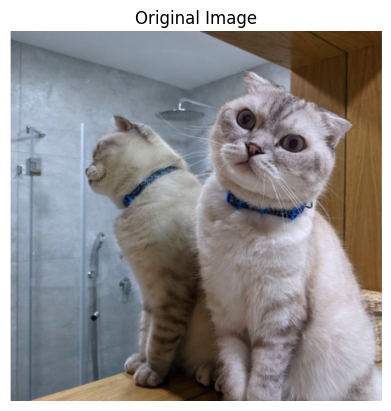

In [8]:
import matplotlib.pyplot as plt
import os
# Define the image path
image_path = '/kaggle/input/catoos/Dataset_Cats/source_cat.png'

# Check if the file exists
if os.path.exists(image_path):
    print("Path exists!")
    # Load and display the image
    img = Image.open(image_path)
    print("Image size:", img.size)  # Print the size of the image
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.title("Original Image")
    plt.show()
else:
    print("Path does not exist.")


In [9]:
LOW_RESOURCE = True
NUM_DDIM_STEPS = 10
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77

In [10]:
def init_random_noise(device, num_words=77):
    return torch.randn(1, num_words, 768).to(device)


class DDIM_Inversion:

    def __init__(self, model, controller=None):
        scheduler = DDIMScheduler(
            beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear",
            clip_sample=False, set_alpha_to_one=False
        )
        self.model = model
        self.tokenizer = self.model.tokenizer
        self.model.scheduler.set_timesteps(NUM_DDIM_STEPS)
        self.prompt = None
        self.context = None

        # Register the controller for attention
        if controller is None:
            controller = EmptyControl()  # Default to no-op control
        self.controller = controller
        register_attention_control(self.model, self.controller)

    
    def prev_step(self, model_output: Union[torch.FloatTensor, np.ndarray], timestep: int, sample: Union[torch.FloatTensor, np.ndarray]):
        prev_timestep = timestep - self.scheduler.config.num_train_timesteps // self.scheduler.num_inference_steps
        alpha_prod_t = self.scheduler.alphas_cumprod[timestep]
        alpha_prod_t_prev = self.scheduler.alphas_cumprod[prev_timestep] if prev_timestep >= 0 else self.scheduler.final_alpha_cumprod
        beta_prod_t = 1 - alpha_prod_t
        pred_original_sample = (sample - beta_prod_t ** 0.5 * model_output) / alpha_prod_t ** 0.5
        pred_sample_direction = (1 - alpha_prod_t_prev) ** 0.5 * model_output
        prev_sample = alpha_prod_t_prev ** 0.5 * pred_original_sample + pred_sample_direction
        return prev_sample
    
    def next_step(self, model_output: Union[torch.FloatTensor, np.ndarray], timestep: int, sample: Union[torch.FloatTensor, np.ndarray]):
        timestep, next_timestep = min(timestep - self.scheduler.config.num_train_timesteps // self.scheduler.num_inference_steps, 999), timestep
        alpha_prod_t = self.scheduler.alphas_cumprod[timestep] if timestep >= 0 else self.scheduler.final_alpha_cumprod
        alpha_prod_t_next = self.scheduler.alphas_cumprod[next_timestep]
        beta_prod_t = 1 - alpha_prod_t
        next_original_sample = (sample - beta_prod_t ** 0.5 * model_output) / alpha_prod_t ** 0.5
        next_sample_direction = (1 - alpha_prod_t_next) ** 0.5 * model_output
        next_sample = alpha_prod_t_next ** 0.5 * next_original_sample + next_sample_direction
        return next_sample
    
    def get_noise_pred_single(self, latents, t, context):
        noise_pred = self.model.unet(latents, t, encoder_hidden_states=context)["sample"]
        return noise_pred

    def get_noise_pred(self, latents, t, is_forward=True, context=None):
        latents_input = torch.cat([latents] * 2)  # Duplicate latents for guidance
        if context is None:
            context = self.context
        guidance_scale = 1 if is_forward else GUIDANCE_SCALE

        # Noise prediction with attention control
        noise_pred = self.model.unet(latents_input, t, encoder_hidden_states=context)["sample"]
        noise_pred_uncond, noise_prediction_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_prediction_text - noise_pred_uncond)

        if is_forward:
            latents = self.next_step(noise_pred, t, latents)
        else:
            latents = self.prev_step(noise_pred, t, latents)
        return latents

    @torch.no_grad()
    def latent2image(self, latents, return_type='np'):
        latents = 1 / 0.18215 * latents.detach()
        image = self.model.vae.decode(latents)['sample']
        if return_type == 'np':
            image = (image / 2 + 0.5).clamp(0, 1)
            image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
            image = (image * 255).astype(np.uint8)
        return image

    @torch.no_grad()
    def image2latent(self, image):
        with torch.no_grad():
            if type(image) is Image:
                image = np.array(image)
            if type(image) is torch.Tensor and image.dim() == 4:
                latents = image
            else:
                image = torch.from_numpy(image).float() / 127.5 - 1
                image = image.permute(2, 0, 1).unsqueeze(0).to(device)
                latents = self.model.vae.encode(image)['latent_dist'].mean
                latents = latents * 0.18215
        return latents

    @torch.no_grad()
    def init_prompt(self, prompt: Optional[str] = None):
        uncond_input = self.model.tokenizer(
            [""], padding="max_length", max_length=self.model.tokenizer.model_max_length,
            return_tensors="pt"
        )
        uncond_embeddings = self.model.text_encoder(uncond_input.input_ids.to(self.model.device))[0]
    
        if prompt is None:
            print("random")
            text_embeddings = init_random_noise(self.model.device)
        else:
            text_input = self.model.tokenizer(
                [prompt],
                padding="max_length",
                max_length=self.model.tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt",
            )
            text_embeddings = self.model.text_encoder(text_input.input_ids.to(self.model.device))[0]
    
        self.context = torch.cat([uncond_embeddings, text_embeddings])
        self.prompt = prompt if prompt is not None else "random_noise"


    @torch.no_grad()
    def ddim_loop(self, latent):
        uncond_embeddings, cond_embeddings = self.context.chunk(2)
        all_latent = [latent]
        latent = latent.clone().detach()
        for i in range(NUM_DDIM_STEPS):
            t = self.model.scheduler.timesteps[len(self.model.scheduler.timesteps) - i - 1]
            noise_pred = self.get_noise_pred_single(latent, t, cond_embeddings)
            latent = self.next_step(noise_pred, t, latent)
            all_latent.append(latent)
        return all_latent

    @property
    def scheduler(self):
        return self.model.scheduler

    @torch.no_grad()
    def ddim_inversion(self, image):
        # Convert image to latent space
        latent = self.image2latent(image)
        image_rec = self.latent2image(latent)

        # Perform DDIM inversion loop with attention control
        ddim_latents = self.ddim_loop(latent)
        return image_rec, ddim_latents

    def invert(
        self,
        image_path: str,
        prompt: str,
        offsets=(0, 0, 0, 0),
        num_inner_steps=10,
        early_stop_epsilon=1e-5,
        verbose=False
    ):
        """
        Inverts an input image into latent space and applies the controller during DDIM inversion.
    
        Parameters:
        - image_path (str): Path to the input image.
        - prompt (str): Text prompt for conditioning.
        - offsets (tuple): Offsets for image cropping or alignment.
        - num_inner_steps (int): Number of steps for internal iterations (optional).
        - early_stop_epsilon (float): Threshold for early stopping.
        - verbose (bool): Verbose logging.
        """
    
        # Initialize the text prompt and register attention control
        self.init_prompt(prompt)
        register_attention_control(self.model, self.controller)
    
        # Load and preprocess the input image
        image_gt = load_512(image_path, *offsets)
        if verbose:
            print("DDIM inversion...")
    
        # Perform DDIM inversion
        image_rec, ddim_latents = self.ddim_inversion(image_gt)
    
        # Return the ground truth image, reconstructed image, and final latent
        return (image_gt, image_rec), ddim_latents[-1]
        

In [11]:
prompt = None
controller = AttentionStore()  # Track attention maps
ddim_inversion = DDIM_Inversion(ldm_stable, controller=controller)

# Perform inversion
(image_gt, image_enc), x_t = ddim_inversion.invert(image_path, prompt, offsets=(0, 0, 0), verbose=True)

random
DDIM inversion...


# Accessing Queries & Keys 

In [12]:
# Access the stored queries and keys at specific timesteps
keys_queries_dict = controller.keys_queries_store

# Print available timesteps
print(keys_queries_dict.keys())  # Example: [0, 5, 10, ..., 45]

# Number of stored timesteps
print(f"Number of stored timesteps with keys/queries: {len(keys_queries_dict)}")


# Access keys and queries for a specific timestep (e.g., timestep 5)
timestep = 1
if timestep in keys_queries_dict:
    timestep_data = keys_queries_dict[timestep]
    
    # Print the keys (e.g., "down_self", "mid_self", "up_self")
    print(f"Available keys at timestep {timestep}: {timestep_data.keys()}")

    # Access specific keys and queries for "down_self"
    if "down_self" in timestep_data:
        down_self_data = timestep_data["down_self"]
        down_self_keys = down_self_data["keys"]  # List of stored key tensors
        down_self_queries = down_self_data["queries"]  # List of stored query tensors
        
        print(f"Number of keys stored for 'down_self' at timestep {timestep}: {len(down_self_keys)}")
        print(f"Number of queries stored for 'down_self' at timestep {timestep}: {len(down_self_queries)}")
        
        # Example: Inspect a specific key or query tensor
        print(f"Shape of the first key tensor for 'down_self': {down_self_keys[0].shape}")
        print(f"Shape of the first query tensor for 'down_self': {down_self_queries[0].shape}")


dict_keys([1])
Number of stored timesteps with keys/queries: 1
Available keys at timestep 1: dict_keys(['down_self', 'up_self'])
Number of keys stored for 'down_self' at timestep 1: 2
Number of queries stored for 'down_self' at timestep 1: 2
Shape of the first key tensor for 'down_self': torch.Size([8, 1024, 80])
Shape of the first query tensor for 'down_self': torch.Size([8, 1024, 80])


# Coordinate Convertor 
- Source Left Ear = (5, 20) , (5, 21), (5,22), (5,23), (4, 20), (4,21), (4,22)
- Source Right Ear = (8, 28) , (8, 29), (8,27), (7,27), (9,28)
- Farmost Ear - (8,9), (8,10), (7,9)
- Leg - (30, 11), (30, 12), (30, 13), (29,13), (29,12), (29,11)
- Mouth - (12, 20), (12,21)
- Nose - (10, 21) 


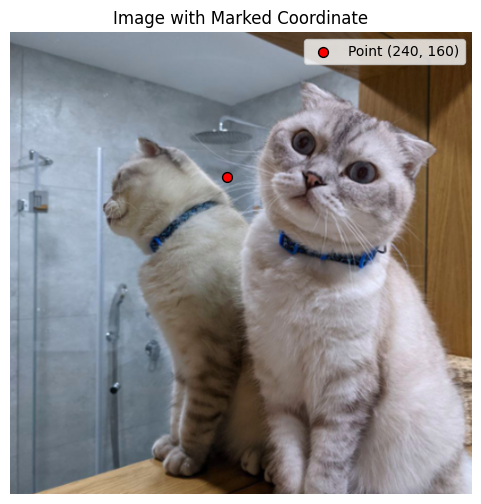

In 64 x 64 grid ( 20.8125  ,  15.0 )


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def visualize_point_on_image(image_path, point, marker_color='red', marker_size=50):
    """
    Loads an image, resizes it to 512x512, and marks a given coordinate.

    Parameters:
    - image_path (str): Path to the image file.
    - point (tuple): Coordinate (x, y) to mark on the image.
    - marker_color (str): Color of the marker (default is 'red').
    - marker_size (int): Size of the marker (default is 50).

    Returns:
    - None (displays the image with the marked point).
    """
    # Load and resize the image
    image = load_512(image_path)
    
    # Display the image
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.scatter(point[0], point[1], color=marker_color, s=marker_size, edgecolors='black', label=f"Point {point}")
    
    # Customize the visualization
    plt.axis('off')  # Hide axes
    plt.legend(loc="upper right")
    plt.title("Image with Marked Coordinate")

    # Show the result
    plt.show()

# Example usage
image_path = '/kaggle/input/catoos/Dataset_Cats/source_cat.png'
point_of_interest = (240, 160)  # Example coordinate

visualize_point_on_image(image_path, point_of_interest)

print("In 64 x 64 grid (", (333/512)*32, " , " ,((240/512)*32),")")

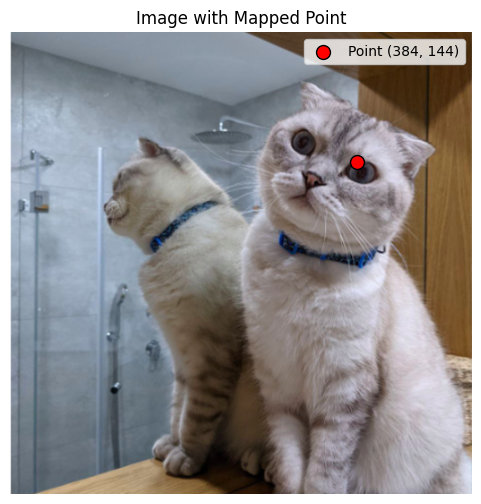

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def map_32_to_512(point_32):
    """
    Maps a coordinate from a 32x32 grid to a 512x512 grid.

    Parameters:
    - point_32 (tuple): (x, y) coordinate in 32x32 space.

    Returns:
    - tuple: Corresponding (x, y) coordinate in 512x512 space.
    """
    scale_factor = 512 / 32  # Scaling factor from 32 to 512
    x_512 = int(point_32[0] * scale_factor)
    y_512 = int(point_32[1] * scale_factor)
    return (x_512, y_512)

def load_512_img(image_path):
    """
    Loads an image and resizes it to 512x512.

    Parameters:
    - image_path (str): Path to the image file.

    Returns:
    - PIL Image resized to (512, 512)
    """
    image = Image.open(image_path)
    image = image.resize((512, 512))
    return image

def visualize_point_on_image(image_path, point_32, marker_color='red', marker_size=100):
    """
    Loads an image, resizes it to 512x512, and marks a given coordinate.

    Parameters:
    - image_path (str): Path to the image file.
    - point_32 (tuple): Coordinate (x, y) in 32x32 space.
    - marker_color (str): Color of the marker (default is 'red').
    - marker_size (int): Size of the marker (default is 100).

    Returns:
    - None (displays the image with the marked point).
    """
    # Convert 32x32 coordinate to 512x512 coordinate
    point_512 = map_32_to_512(point_32)

    # Load and resize the image
    image = load_512_img(image_path)
    
    # Display the image
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.scatter(point_512[0], point_512[1], color=marker_color, s=marker_size, edgecolors='black', label=f"Point {point_512}")
    
    # Customize the visualization
    plt.axis('off')  # Hide axes
    plt.legend(loc="upper right")
    plt.title("Image with Mapped Point")

    # Show the result
    plt.show()

# Example usage
image_path = '/kaggle/input/catoos/Dataset_Cats/source_cat.png'
point_32 = (24, 9)  # Example coordinate in 32x32 grid

visualize_point_on_image(image_path, point_32)


# Target Image 

Path exists!
Image size: (1800, 1801)


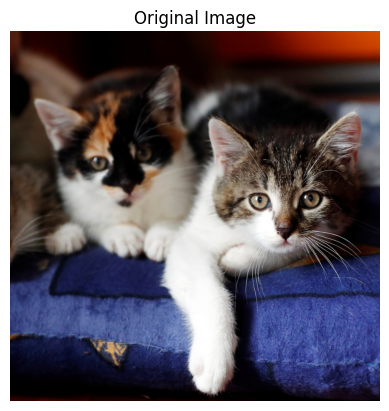

In [15]:
import matplotlib.pyplot as plt
import os
# Define the image path
#image_path_target = '/kaggle/input/catoos/cat_body.jpg'
image_path_target = '/kaggle/input/catoos/Dataset_Cats/target_cat.jpeg'

# Check if the file exists
if os.path.exists(image_path):
    print("Path exists!")
    # Load and display the image
    img = Image.open(image_path_target)
    print("Image size:", img.size)  # Print the size of the image
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.title("Original Image")
    plt.show()
else:
    print("Path does not exist.")


In [16]:

prompt = None
controller_target = AttentionStore()  # Track attention maps
ddim_inversion = DDIM_Inversion(ldm_stable, controller=controller_target)

# Perform inversion
(image_gt, image_enc), x_t = ddim_inversion.invert(image_path_target, prompt, offsets=(0, 0, 0), verbose=True)


random
DDIM inversion...


## Accessing Queries and Keys 

In [17]:
# Access the stored queries and keys at specific timesteps
keys_queries_dict_target = controller_target.keys_queries_store

# Print available timesteps
print(keys_queries_dict_target.keys())  # Example: [0, 5, 10, ..., 45]

# Number of stored timesteps
print(f"Number of stored timesteps with keys/queries: {len(keys_queries_dict)}")

# Access keys and queries for a specific timestep (e.g., timestep 5)
timestep = 1
if timestep in keys_queries_dict_target:
    timestep_data = keys_queries_dict_target[timestep]
    
    # Print the keys (e.g., "down_self", "mid_self", "up_self")
    print(f"Available keys at timestep {timestep}: {timestep_data.keys()}")

    # Access specific keys and queries for "down_self"
    if "down_self" in timestep_data:
        down_self_data = timestep_data["down_self"]
        down_self_keys_target = down_self_data["keys"]  # List of stored key tensors
        down_self_queries_target = down_self_data["queries"]  # List of stored query tensors
        
        print(f"Number of keys stored for 'down_self' at timestep {timestep}: {len(down_self_keys_target)}")
        print(f"Number of queries stored for 'down_self' at timestep {timestep}: {len(down_self_queries_target)}")
        
        # Example: Inspect a specific key or query tensor
        print(f"Shape of the first key tensor for 'down_self': {down_self_keys_target[0].shape}")
        print(f"Shape of the first query tensor for 'down_self': {down_self_queries_target[0].shape}")


dict_keys([1])
Number of stored timesteps with keys/queries: 1
Available keys at timestep 1: dict_keys(['down_self', 'up_self'])
Number of keys stored for 'down_self' at timestep 1: 2
Number of queries stored for 'down_self' at timestep 1: 2
Shape of the first key tensor for 'down_self': torch.Size([8, 1024, 80])
Shape of the first query tensor for 'down_self': torch.Size([8, 1024, 80])


# Calculating Self-Attention for Both source and target image 

In [18]:
 import torch
import math

d_k = 32  # Dimension of keys/queries per head
res = 32  # Reshape resolution


In [19]:
# Slice keys and queries for target and source first
target_attention_key_1 = down_self_keys_target[0][4:]  # Slice first
target_attention_query_1 = down_self_queries_target[0][4:]
source_attention_key_1 = down_self_keys[0][4:]
source_attention_query_1 = down_self_queries[0][4:]

target_attention_key_2 = down_self_keys_target[1][4:]
target_attention_query_2 = down_self_queries_target[1][4:]
source_attention_key_2 = down_self_keys[1][4:]
source_attention_query_2 = down_self_queries[1][4:]

In [20]:
# Compute self-attention for source and target
scores_source_1 = torch.matmul(source_attention_query_1, source_attention_key_1.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [4, 1024, 1024]
attention_source_1 = torch.softmax(scores_source_1, dim=-1)  # Softmax over the last dimension
summed_attention_source_1 = attention_source_1.sum(dim=0)  # Summing along the heads immediately
#summed_attention_source_1 = attention_source_1.mean(dim=0)  # Averaging across heads


scores_source_2 = torch.matmul(source_attention_query_2, source_attention_key_2.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [4, 1024, 1024]
attention_source_2 = torch.softmax(scores_source_2, dim=-1)  # Softmax over the last dimension
summed_attention_source_2 = attention_source_2.sum(dim=0)  # Summing along the heads immediately
summed_attention_source_2 = attention_source_2.mean(dim=0)

In [21]:
# Aggregate the attention maps
aggregated_maps_source = []

reshaped_attention_source_1 = summed_attention_source_1.view(res, res, res, res).clone().detach()
reshaped_attention_source_1 /= reshaped_attention_source_1.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source.append(reshaped_attention_source_1)

reshaped_attention_source_2 = summed_attention_source_2.view(res, res, res, res).clone().detach()
reshaped_attention_source_2 /= reshaped_attention_source_2.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source.append(reshaped_attention_source_2)


# Compute averaged maps
aggregated_tensor_source = torch.stack(aggregated_maps_source, dim=0)
averaged_map_source = aggregated_tensor_source.mean(dim=0)



# Print resulting shapes for verification
print("averaged_map_source", averaged_map_source.shape)


averaged_map_source torch.Size([32, 32, 32, 32])


In [22]:
# Compute self-attention for source and target
scores_target_1 = torch.matmul(target_attention_query_1, target_attention_key_1.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [4, 1024, 1024]
attention_target_1 = torch.softmax(scores_target_1, dim=-1)  # Softmax over the last dimension
summed_attention_target_1 = attention_target_1.sum(dim=0)  # Summing along the heads immediately
#summed_attention_source_1 = attention_source_1.mean(dim=0)  # Averaging across heads


scores_target_2 = torch.matmul(target_attention_query_2, target_attention_key_2.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [4, 1024, 1024]
attention_target_2 = torch.softmax(scores_target_2, dim=-1)  # Softmax over the last dimension
summed_attention_target_2 = attention_target_2.sum(dim=0)  # Summing along the heads immediately
summed_attention_target_2 = attention_target_2.mean(dim=0)

aggregated_maps_target = []

reshaped_attention_target_1 = summed_attention_target_1.view(res, res, res, res).clone().detach()
reshaped_attention_target_1 /= reshaped_attention_target_1.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target.append(reshaped_attention_target_1)

reshaped_attention_target_2 = summed_attention_target_2.view(res, res, res, res).clone().detach()
reshaped_attention_target_2 /= reshaped_attention_target_2.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target.append(reshaped_attention_target_2)


# Compute averaged maps
aggregated_tensor_target = torch.stack(aggregated_maps_target, dim=0)
averaged_map_target = aggregated_tensor_target.mean(dim=0)




# Cross-Attention keys 

In [23]:
# Slice keys and queries for target and source first
target_attention_key_1 = down_self_keys_target[0][4:]  # Slice first
target_attention_query_1 = down_self_queries_target[0][4:]
source_attention_key_1 = down_self_keys[0][4:]
source_attention_query_1 = down_self_queries[0][4:]

target_attention_key_2 = down_self_keys_target[1][4:]
target_attention_query_2 = down_self_queries_target[1][4:]
source_attention_key_2 = down_self_keys[1][4:]
source_attention_query_2 = down_self_queries[1][4:]

In [24]:
def match_distribution(target, source):
    """Transforms target tensor to have the same mean and std as source."""
    mean_target = target.mean(dim=-1, keepdim=True)
    std_target = target.std(dim=-1, keepdim=True)

    mean_source = source.mean(dim=-1, keepdim=True)
    std_source = source.std(dim=-1, keepdim=True)

    transformed_target = ((target - mean_target) / (std_target + 1e-6)) * std_source + mean_source
    return transformed_target

target_attention_key_1_matched = match_distribution(target_attention_key_1, source_attention_query_1)
target_attention_key_2_matched = match_distribution(target_attention_key_2, source_attention_query_2)

source_attention_key_1_matched = match_distribution(source_attention_key_1, target_attention_query_1)
source_attention_key_2_matched = match_distribution(source_attention_key_2, target_attention_query_2)

In [25]:
import torch

def compute_stats(tensor, name):
    """
    Computes and prints the mean and standard deviation of a tensor.

    Parameters:
    - tensor (torch.Tensor): The input tensor.
    - name (str): Name of the tensor for printing.
    """
    mean_val = tensor.mean().item()
    std_val = tensor.std().item()
    print(f"{name} -> Mean: {mean_val:.6f}, Std Dev: {std_val:.6f}")
    return mean_val, std_val

# Compute statistics for each tensor
stats = {}

stats["target_attention_query_1"] = compute_stats(target_attention_query_1, "target_attention_query_1")
stats["source_attention_query_1"] = compute_stats(source_attention_query_1, "source_attention_query_1")

stats["target_attention_query_2"] = compute_stats(target_attention_query_2, "target_attention_query_2")
stats["source_attention_query_2"] = compute_stats(source_attention_query_2, "source_attention_query_2")


stats["source_attention_key_1"] = compute_stats(source_attention_key_1, "source_attention_key_1")
stats["target_attention_key_1"] = compute_stats(target_attention_key_1, "target_attention_key_1")
stats["target_attention_key_1_matched"] = compute_stats(target_attention_key_1_matched, "target_attention_key_1_matched")

stats["source_attention_key_2"] = compute_stats(source_attention_key_2, "source_attention_key_2")
stats["target_attention_key_2"] = compute_stats(target_attention_key_2, "target_attention_key_2")
stats["target_attention_key_2_matched"] = compute_stats(target_attention_key_2_matched, "target_attention_key_2_matched")

target_attention_query_1 -> Mean: 0.000113, Std Dev: 0.966654
source_attention_query_1 -> Mean: 0.012909, Std Dev: 0.910561
target_attention_query_2 -> Mean: 0.000578, Std Dev: 1.051775
source_attention_query_2 -> Mean: -0.003753, Std Dev: 0.959689
source_attention_key_1 -> Mean: 0.037629, Std Dev: 0.956280
target_attention_key_1 -> Mean: 0.020344, Std Dev: 1.036640
target_attention_key_1_matched -> Mean: 0.012909, Std Dev: 0.910560
source_attention_key_2 -> Mean: -0.053579, Std Dev: 1.033109
target_attention_key_2 -> Mean: -0.034614, Std Dev: 1.139683
target_attention_key_2_matched -> Mean: -0.003753, Std Dev: 0.959688


In [26]:
source_to_target_1 = torch.matmul(source_attention_query_1, target_attention_key_1.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [8, 1024, 1024]
attention_source_to_target_1 = torch.softmax(source_to_target_1, dim=-1)  # Softmax over the last dimension

target_to_source_1 = torch.matmul(target_attention_query_1, source_attention_key_1.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [8, 1024, 1024]
attention_target_to_source_1 = torch.softmax(target_to_source_1, dim=-1)  # Softmax over the last dimension

source_to_target_2 = torch.matmul(source_attention_query_2, target_attention_key_2.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [8, 1024, 1024]
attention_source_to_target_2 = torch.softmax(source_to_target_2, dim=-1)  # Softmax over the last dimension

target_to_source_2 = torch.matmul(target_attention_query_2, source_attention_key_2.transpose(-2, -1)) / math.sqrt(d_k)  # Shape: [8, 1024, 1024]
attention_target_to_source_2 = torch.softmax(target_to_source_2, dim=-1)  # Softmax over the last dimension

In [27]:
res = 32 

aggregated_maps_source_to_target = []
aggregated_maps_target_to_source = []


reshaped_map_source_to_target_1 = attention_source_to_target_1.view(attention_source_to_target_1.size(0), res, res, res, res).clone().detach()
reshaped_map_source_to_target_1 = reshaped_map_source_to_target_1.sum(dim=0)
reshaped_map_source_to_target_1 /= reshaped_map_source_to_target_1.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source_to_target.append(reshaped_map_source_to_target_1)

reshaped_map_source_to_target_2 = attention_source_to_target_2.view(attention_source_to_target_2.size(0), res, res, res, res).clone().detach()
reshaped_map_source_to_target_2 = reshaped_map_source_to_target_2.sum(dim=0)
reshaped_map_source_to_target_2 /= reshaped_map_source_to_target_2.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source_to_target.append(reshaped_map_source_to_target_2)



reshaped_map_target_to_source_1 = attention_target_to_source_1.view(attention_target_to_source_1.size(0), res, res, res, res).clone().detach()
reshaped_map_target_to_source_1 = reshaped_map_target_to_source_1.sum(dim=0)
reshaped_map_target_to_source_1 /= reshaped_map_target_to_source_1.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target_to_source.append(reshaped_map_target_to_source_1)


reshaped_map_target_to_source_2 = attention_target_to_source_2.view(attention_target_to_source_2.size(0), res, res, res, res).clone().detach()
reshaped_map_target_to_source_2 = reshaped_map_target_to_source_2.sum(dim=0)
reshaped_map_target_to_source_2 /= reshaped_map_target_to_source_2.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target_to_source.append(reshaped_map_target_to_source_2)



aggregated_tensor_source_to_target = torch.stack(aggregated_maps_source_to_target, dim=0)
averaged_map_source_to_target = aggregated_tensor_source_to_target.mean(dim=0)

aggregated_tensor_target_to_source = torch.stack(aggregated_maps_target_to_source, dim=0)
averaged_map_target_to_source = aggregated_tensor_target_to_source.mean(dim=0)


# Print resulting shapes for verification

print("averaged_map", averaged_map_target_to_source.shape)

averaged_map torch.Size([32, 32, 32, 32])


In [28]:
import torch
import math

# Define the temperature parameter (values < 1 sharpen attention)
temperature = 0.7

# Compute Source-to-Target Attention with Temperature Scaling
source_to_target_1_matched = torch.matmul(source_attention_query_1, target_attention_key_1_matched.transpose(-2, -1)) / math.sqrt(d_k)
attention_source_to_target_1_matched = torch.softmax(source_to_target_1_matched / temperature, dim=-1)  # Apply temperature scaling

source_to_target_2_matched = torch.matmul(source_attention_query_2, target_attention_key_2_matched.transpose(-2, -1)) / math.sqrt(d_k)
attention_source_to_target_2_matched = torch.softmax(source_to_target_2_matched / temperature, dim=-1)  # Apply temperature scaling

# Aggregate Maps (Source-to-Target)
aggregated_maps_source_to_target_matched = []

reshaped_map_source_to_target_1_matched = attention_source_to_target_1_matched.view(attention_source_to_target_1_matched.size(0), res, res, res, res).clone().detach()
reshaped_map_source_to_target_1_matched = reshaped_map_source_to_target_1_matched.sum(dim=0)
reshaped_map_source_to_target_1_matched /= reshaped_map_source_to_target_1_matched.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source_to_target_matched.append(reshaped_map_source_to_target_1_matched)

reshaped_map_source_to_target_2_matched = attention_source_to_target_2_matched.view(attention_source_to_target_2_matched.size(0), res, res, res, res).clone().detach()
reshaped_map_source_to_target_2_matched = reshaped_map_source_to_target_2_matched.sum(dim=0)
reshaped_map_source_to_target_2_matched /= reshaped_map_source_to_target_2_matched.sum(dim=(2, 3), keepdim=True)
aggregated_maps_source_to_target_matched.append(reshaped_map_source_to_target_2_matched)

aggregated_maps_source_to_target_matched = torch.stack(aggregated_maps_source_to_target_matched, dim=0)
averaged_map_source_to_target_matched = aggregated_maps_source_to_target_matched.mean(dim=0)

# Compute Target-to-Source Attention with Temperature Scaling
target_to_source_1_matched = torch.matmul(target_attention_query_1, source_attention_key_1_matched.transpose(-2, -1)) / math.sqrt(d_k)
attention_target_to_source_1_matched = torch.softmax(target_to_source_1_matched / temperature, dim=-1)  # Apply temperature scaling

target_to_source_2_matched = torch.matmul(target_attention_query_2, source_attention_key_2_matched.transpose(-2, -1)) / math.sqrt(d_k)
attention_target_to_source_2_matched = torch.softmax(target_to_source_2_matched / temperature, dim=-1)  # Apply temperature scaling

# Aggregate Maps (Target-to-Source)
aggregated_maps_target_to_source_matched = []

reshaped_map_target_to_source_1_matched = attention_target_to_source_1_matched.view(attention_target_to_source_1_matched.size(0), res, res, res, res).clone().detach()
reshaped_map_target_to_source_1_matched = reshaped_map_target_to_source_1_matched.sum(dim=0)
reshaped_map_target_to_source_1_matched /= reshaped_map_target_to_source_1_matched.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target_to_source_matched.append(reshaped_map_target_to_source_1_matched)

reshaped_map_target_to_source_2_matched = attention_target_to_source_2_matched.view(attention_target_to_source_2_matched.size(0), res, res, res, res).clone().detach()
reshaped_map_target_to_source_2_matched = reshaped_map_target_to_source_2_matched.sum(dim=0)
reshaped_map_target_to_source_2_matched /= reshaped_map_target_to_source_2_matched.sum(dim=(2, 3), keepdim=True)
aggregated_maps_target_to_source_matched.append(reshaped_map_target_to_source_2_matched)

aggregated_maps_target_to_source_matched = torch.stack(aggregated_maps_target_to_source_matched, dim=0)
averaged_map_target_to_source_matched = aggregated_maps_target_to_source_matched.mean(dim=0)


# Entire Pass with nearest neighbors 

In [77]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def get_neighbors(i, j, shape):
    """
    Returns the 8-connected neighbors of (i, j) within the given shape.
    """
    neighbors = [(i + di, j + dj) for di in [-1, 0, 1] for dj in [-1, 0, 1] if not (di == 0 and dj == 0)]
    return [(x, y) for x, y in neighbors if 0 <= x < shape[0] and 0 <= y < shape[1]]

def KL(x, Y):
    """
    Computes symmetric KL divergence between x and Y.
    """
    quotient = torch.log(x) - torch.log(Y)
    kl_1 = (x * quotient).sum(dim=(-2, -1)) / 2
    kl_2 = -(Y * quotient).sum(dim=(-2, -1)) / 2
    return kl_1 + kl_2

def visualize_attention_slices_with_KL(attention_source, attention_source_to_target, attention_target_to_source, slices_to_visualize):
    """
    Visualizes attention slices side-by-side, computes KL divergence, and stores full attention paths.
    """
    num_slices = len(slices_to_visualize)
    num_cols = 1 + 2 * 8  # (1 source + 8 source-to-target + 8 target-to-source)
    
    fig, axes = plt.subplots(num_slices, num_cols, figsize=(3 * num_cols, 3 * num_slices))
    
    if num_slices == 1:
        axes = np.expand_dims(axes, axis=0)
    
    argmax_dict = {}
    kl_dict = {}
    trace_dict = {}
    
    for row_idx, (i, j) in enumerate(slices_to_visualize):
        source_slice = attention_source[i, j, :, :].cpu()
        neighbors = get_neighbors(i, j, attention_source.shape[:2])
        argmax_dict[(i, j)] = neighbors
        trace_dict[(i, j)] = []
        kl_dict[(i, j)] = {"D_KL(Tgt→Src[Ref] || Tgt→Src[x, y])": {}, "D_KL(Tgt→Src[x, y] || Source)": {}}

        ax_source = axes[row_idx, 0]
        im_source = ax_source.imshow(source_slice.numpy(), cmap='viridis')
        ax_source.set_title(f"Source[{i}, {j}]")
        fig.colorbar(im_source, ax=ax_source, fraction=0.046, pad=0.04)
        
        target_argmax_coords = []
        for k_idx, (x_src, y_src) in enumerate(neighbors):
            source_to_target_slice = attention_source_to_target[x_src, y_src, :, :].cpu()
            flat_index = torch.argmax(source_to_target_slice).item()
            x_src_trg, y_src_trg = np.unravel_index(flat_index, source_to_target_slice.shape)
            target_argmax_coords.append((x_src_trg, y_src_trg))
            
            ax_target = axes[row_idx, k_idx + 1]
            im_target = ax_target.imshow(source_to_target_slice.numpy(), cmap='viridis')
            ax_target.scatter(y_src_trg, x_src_trg, color='red', marker='x', s=50)
            ax_target.set_title(f"Src→Tgt[{x_src}, {y_src}]")
            fig.colorbar(im_target, ax=ax_target, fraction=0.046, pad=0.04)
        
        max_target_to_source_slice = attention_target_to_source[target_argmax_coords[0][0], target_argmax_coords[0][1], :, :].cpu()
        
        for k_idx, (x_src_trg, y_src_trg) in enumerate(target_argmax_coords):
            target_to_source_slice = attention_target_to_source[x_src_trg, y_src_trg, :, :].cpu()
            flat_index = torch.argmax(target_to_source_slice).item()
            x_trg_src, y_trg_src = np.unravel_index(flat_index, target_to_source_slice.shape)
            trace_dict[(i, j)].append(((neighbors[k_idx]), (x_src_trg, y_src_trg), (x_trg_src, y_trg_src)))
            kl_value_ref_tgt = KL(max_target_to_source_slice, target_to_source_slice).item()
            kl_dict[(i, j)]["D_KL(Tgt→Src[Ref] || Tgt→Src[x, y])"][(x_src_trg, y_src_trg)] = kl_value_ref_tgt
            kl_value_tgt_src = KL(target_to_source_slice, source_slice).item()
            kl_dict[(i, j)]["D_KL(Tgt→Src[x, y] || Source)"][(x_src_trg, y_src_trg)] = kl_value_tgt_src
            
            ax_final = axes[row_idx, 8 + k_idx + 1]
            im_final = ax_final.imshow(target_to_source_slice.numpy(), cmap='viridis')
            ax_final.scatter(y_trg_src, x_trg_src, color='yellow', marker='x', s=50)
            ax_final.set_title(f"Tgt→Src[{x_src_trg}, {y_src_trg}]")
            fig.colorbar(im_final, ax=ax_final, fraction=0.046, pad=0.04)
    
    plt.subplots_adjust(hspace=0.3, wspace=0.3)
    plt.tight_layout(pad=0.5)
    plt.show()
    
    return argmax_dict, kl_dict, trace_dict

"""
slices_to_visualize = [(5, 20), (5, 21), (5, 22),(5,23),(4,20),(4,21),(4,22),
                      (8,28),(8,29),(8,27),(7,27),(9,28),
                      (8,9),(8,10),(7,9),
                      (30,11),(30,12),(30,13),(29,13)]

"""

# Example usage
slices_to_visualize = [(10, 20), (9, 24), (2, 10)]

"""
argmax_results = visualize_attention_slices_with_KL(
    averaged_map_source, 
    averaged_map_source_to_target, 
    averaged_map_target_to_source, 
    slices_to_visualize
)
"""




'\nargmax_results = visualize_attention_slices_with_KL(\n    averaged_map_source, \n    averaged_map_source_to_target, \n    averaged_map_target_to_source, \n    slices_to_visualize\n)\n'

In [78]:
import torch
import numpy as np

def get_neighbors_including_self(i, j, shape):
    """
    Returns the 8-connected neighbors of (i, j) including itself within the given shape.
    """
    neighbors = [(i + di, j + dj) for di in [-1, 0, 1] for dj in [-1, 0, 1]]
    return [(x, y) for x, y in neighbors if 0 <= x < shape[0] and 0 <= y < shape[1]]

def KL(x, Y):
    """
    Computes symmetric KL divergence between x and Y.
    """
    quotient = torch.log(x) - torch.log(Y)
    kl_1 = (x * quotient).sum(dim=(-2, -1)) / 2
    kl_2 = -(Y * quotient).sum(dim=(-2, -1)) / 2
    return kl_1 + kl_2

def entire_pass(attention_source, attention_source_to_target, attention_target_to_source, slices_to_visualize):
    """
    Computes KL divergence and stores full attention paths using neighboring points and the point itself.
    """
    argmax_dict = {}
    kl_dict = {}
    trace_dict = {}
    
    for row_idx, (i, j) in enumerate(slices_to_visualize):
        source_slice = attention_source[i, j, :, :].cpu()
        neighbors = get_neighbors_including_self(i, j, attention_source.shape[:2])
        argmax_dict[(i, j)] = neighbors
        trace_dict[(i, j)] = []
        kl_dict[(i, j)] = {"D_KL(Tgt→Src[Ref] || Tgt→Src[x, y])": {}, "D_KL(Tgt→Src[x, y] || Source)": {}}

        target_argmax_coords = []
        for k_idx, (x_src, y_src) in enumerate(neighbors):
            source_to_target_slice = attention_source_to_target[x_src, y_src, :, :].cpu()
            flat_index = torch.argmax(source_to_target_slice).item()
            x_src_trg, y_src_trg = np.unravel_index(flat_index, source_to_target_slice.shape)
            target_argmax_coords.append((x_src_trg, y_src_trg))

        max_target_to_source_slice = attention_target_to_source[target_argmax_coords[0][0], target_argmax_coords[0][1], :, :].cpu()
        
        for k_idx, (x_src_trg, y_src_trg) in enumerate(target_argmax_coords):
            target_to_source_slice = attention_target_to_source[x_src_trg, y_src_trg, :, :].cpu()
            flat_index = torch.argmax(target_to_source_slice).item()
            x_trg_src, y_trg_src = np.unravel_index(flat_index, target_to_source_slice.shape)
            trace_dict[(i, j)].append(((neighbors[k_idx]), (x_src_trg, y_src_trg), (x_trg_src, y_trg_src)))
            kl_value_ref_tgt = KL(max_target_to_source_slice, target_to_source_slice).item()
            kl_dict[(i, j)]["D_KL(Tgt→Src[Ref] || Tgt→Src[x, y])"][(x_src_trg, y_src_trg)] = kl_value_ref_tgt
            kl_value_tgt_src = KL(target_to_source_slice, source_slice).item()
            kl_dict[(i, j)]["D_KL(Tgt→Src[x, y] || Source)"][(x_src_trg, y_src_trg)] = kl_value_tgt_src
    
    return argmax_dict, kl_dict, trace_dict

In [107]:
#slices_of_interest = [(3,i) for i in range(32)]

"""
slices_of_interest = [(5, 20), (5, 21), (5, 22),(5,23),(4,20),(4,21),(4,22),
                      (8,28),(8,29),(8,27),(7,27),(9,28),
                      (8,9),(8,10),(7,9),
                      (30,11),(30,12),(30,13),(29,13)]

"""

dataset = [(i,j) for i in range(32) for j in range(32)]

argmax_results, kl_dict, trace_results = entire_pass(
    averaged_map_source, 
    averaged_map_source_to_target, 
    averaged_map_target_to_source, 
    dataset
)



In [108]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.cm as cm

def visualize_trace_on_grid_with_coordinates(trace_results, source_image_path, target_image_path):
    """
    Visualizes trace results on:
    1. A 32x32 grid overlaid on images with arrows showing the mapping of points.
    2. A separate 32x32 coordinate grid where crosses are shown exactly at their grid positions.
    
    - First row: Images (Source, Intermediate, Final)
    - Second row: 32x32 Grid Representations
    """
    # Load and resize images to 320x320 (to match 32x32 grid with 10-pixel spacing)
    img_size = 320
    grid_size = 32
    cell_size = img_size // grid_size  # 10 pixels per grid cell

    source_img = cv2.cvtColor(cv2.resize(cv2.imread(source_image_path), (img_size, img_size)), cv2.COLOR_BGR2RGB)
    target_img = cv2.cvtColor(cv2.resize(cv2.imread(target_image_path), (img_size, img_size)), cv2.COLOR_BGR2RGB)

    cmap = cm.get_cmap("tab10")  # Colormap for distinct colors

    for key, traces in trace_results.items():
        # Convert traces into NumPy arrays for efficient indexing
        src_coords = np.array([src for src, _, _ in traces])
        inter_coords = np.array([src_trg for _, src_trg, _ in traces])
        trg_coords = np.array([trg_src for _, _, trg_src in traces])

        # Get unique points and assign colors
        all_coords = np.vstack((src_coords, inter_coords, trg_coords))
        unique_points, indices = np.unique(all_coords, axis=0, return_inverse=True)
        colors = [cmap(i % 10) for i in indices]  # Assign a color per unique point

        # Create a 2-row visualization layout with increased figure size
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        titles = [f"Source [{key[0]}, {key[1]}]", "Intermediate (Target)", "Final (Back to Source)"]
        images = [source_img, target_img, source_img]
        coords_list = [src_coords, inter_coords, trg_coords]

        for row in range(2):  # First row = Images, Second row = Grid
            for col, (ax, title, coords) in enumerate(zip(axes[row], titles, coords_list)):
                ax.set_title(title, fontsize=12)

                if row == 0:
                    # First row: Image with grid overlay
                    ax.imshow(images[col], alpha=0.3)  # Dim image for better visibility

                    # Overlay 32x32 grid with lighter lines
                    for i in range(grid_size + 1):
                        ax.axhline(i * cell_size, color='gray', linestyle='--', linewidth=0.3, alpha=0.7)
                        ax.axvline(i * cell_size, color='gray', linestyle='--', linewidth=0.3, alpha=0.7)

                    # Scatter points ensuring alignment with the grid
                    if coords.size:
                        for i, (y, x) in enumerate(coords):
                            px_x, px_y = x * cell_size + cell_size // 2, y * cell_size + cell_size // 2
                            ax.scatter(px_x, px_y, color=colors[i], s=50, marker='x')

                else:
                    # Second row: 32x32 grid with improved spacing
                    ax.set_xlim(-1, grid_size)  # Add margin
                    ax.set_ylim(grid_size, -1)  # Flip y-axis for correct alignment
                    ax.set_xticks(np.arange(0, grid_size, 4))  # Show fewer x ticks
                    ax.set_yticks(np.arange(0, grid_size, 4))  # Show fewer y ticks
                    ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)  # Light grid

                    # Scatter points with corrected (x, y) placement
                    if coords.size:
                        for i, (y, x) in enumerate(coords):
                            ax.scatter(x, y, color=colors[i], s=50, marker='x')

        plt.tight_layout()
        plt.show()



# MSE Loss 

For now, we use MSE loss to quantify $d(x_s,x_s'$. Keep in mind that we also have KL divergence at our disposal. However, it is not quite clear to me for now how exactly I can apply that. 

In [109]:
def compute_mse(trace_results):
    mse_results = {}
    
    for key, traces in trace_results.items():
        errors = []
        for src, _, trg_src in traces:
            mse = np.mean((np.array(src) - np.array(trg_src)) ** 2)
            errors.append(mse)
        
        mse_results[key] = errors
    
    return mse_results


In [110]:
mse_results = compute_mse(trace_results)


# Organzing the Data in PD frame 

In [111]:
import pandas as pd

# Function to organize trace results, MSE values, and KL divergence into a structured DataFrame
def organize_results(trace_results, mse_results, kl_dict):
    data = []

    for key, traces in trace_results.items():
        for idx, (src, src_trg, trg_src) in enumerate(traces):
            mse_value = mse_results[key][idx] if key in mse_results and idx < len(mse_results[key]) else None

            kl_ref_tgt = kl_dict[key]["D_KL(Tgt→Src[Ref] || Tgt→Src[x, y])"].get(src_trg, None)
            kl_tgt_src = kl_dict[key]["D_KL(Tgt→Src[x, y] || Source)"].get(src_trg, None)

            data.append({
                "Source": key,
                "Step 1 (Src)": src,
                "Step 2 (Src → Tgt)": src_trg,
                "Step 3 (Tgt → Src)": trg_src,
                "MSE (Src vs. Tgt→Src)": mse_value,
                "KL (Ref || Tgt→Src)": kl_ref_tgt,
                "KL (Tgt→Src || Src)": kl_tgt_src
            })

    df = pd.DataFrame(data)
    return df

# Organizing results into a DataFrame
organized_df = organize_results(trace_results, mse_results, kl_dict)


In [112]:
from IPython.display import display
#display(organized_df)

# Computing MD

There are two different approaches we can take here. We can compute MD globally or MD locally. Firstly, let us consider the evaluation of MD globally. This tells us which points are most frequently mapped to overall in the dataset.  This would be useful for detecting large-scale feature collapses.  We will compute it as following: 
$$
MD_{\text{global}}(y) = \sum_{x_s \in \text{all source points}} 1(f(x_s) = y)
$$

However, MD might ignore localized collapse that only occur in specific regions. To mitigate this, we compute MD locally (Using Only Nearby Points). This tells us how many points in a local neighborhood map to the same region. This is computed as: 

$$
MD_{\text{local}}(y) = \sum_{x_s \in N(y)} 1(f(x_s) = y)
$$

where \( N(y) \) is a small local neighborhood around \( y \). This will us Detect localized misalignment (e.g., distorted areas where multiple neighbors collapse to the same target).


In [113]:
# Convert coordinate strings to tuples (only if needed)
def parse_tuple(s):
    if isinstance(s, str):  # Only parse if it's a string
        return tuple(map(int, s.strip("()").split(", ")))
    return s  # If already a tuple, return as is

# Apply the function safely
organized_df["Step 1 (Src)"] = organized_df["Step 1 (Src)"].apply(parse_tuple)
organized_df["Step 2 (Src → Tgt)"] = organized_df["Step 2 (Src → Tgt)"].apply(parse_tuple)

# Initialize a 32x32 grid for Mapping Density (MD)
md_grid = np.zeros((32, 32), dtype=int)

# Count occurrences of each target point
for target in organized_df["Step 2 (Src → Tgt)"]:
    x, y = target  # Target coordinates
    md_grid[x, y] += 1  # Increment count

# Convert to a DataFrame for easy visualization
md_df = pd.DataFrame(md_grid)


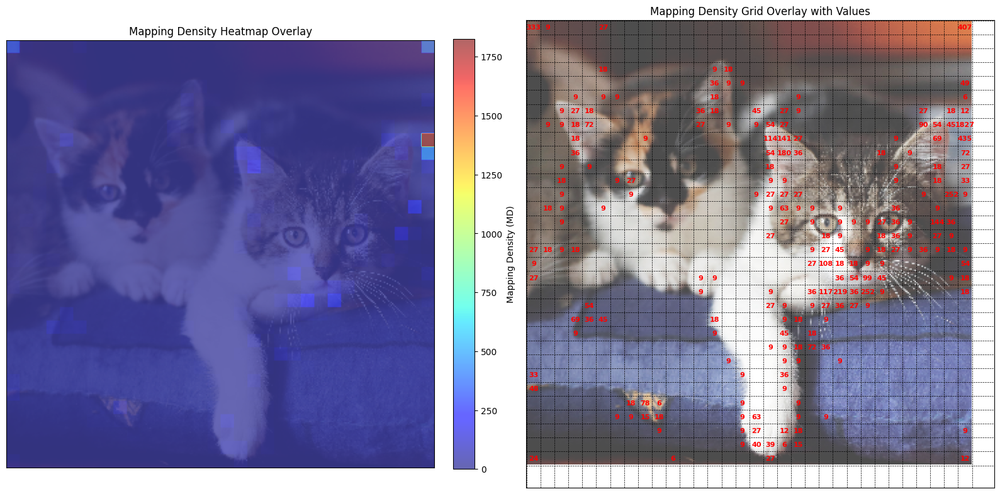

In [114]:
import matplotlib.colors as mcolors

# Create a side-by-side visualization: (1) Heatmap overlay (2) Numeric overlay on the image
target_img_path = '/kaggle/input/catoos/Dataset_Cats/target_cat.jpeg'
target_img = cv2.imread(image_path_target)
target_img = cv2.cvtColor(target_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB


# Resize image to match the 32x32 grid scale (assuming original is larger)
img_size = 320  # Example target size (adjust if needed)
grid_size = 32
cell_size = 320//32
target_img = cv2.resize(target_img, (img_size, img_size))

# Resize MD grid to match image size for overlaying
md_resized = cv2.resize(md_grid.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)


fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# --- First Plot: Heatmap Overlay ---
axes[0].imshow(target_img, alpha=0.5)  # Target image with transparency
heatmap = axes[0].imshow(md_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=md_grid.max()))

# Add color bar for heatmap
fig.colorbar(heatmap, ax=axes[0], fraction=0.046, pad=0.04, label="Mapping Density (MD)")

# Hide axis labels
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_title("Mapping Density Heatmap Overlay")

# --- Second Plot: Numeric Grid Overlay ---
axes[1].imshow(target_img, alpha=0.7)  # Target image with transparency

# Overlay grid lines
for i in range(grid_size + 1):
    axes[1].axhline(i * cell_size, color='black', linestyle='--', linewidth=0.5)
    axes[1].axvline(i * cell_size, color='black', linestyle='--', linewidth=0.5)

# Overlay MD values at each grid cell's center
for i in range(grid_size):
    for j in range(grid_size):
        md_value = md_grid[i, j]
        if md_value > 0:  # Only show nonzero values
            axes[1].text(j * cell_size + cell_size // 2, 
                         i * cell_size + cell_size // 2, 
                         str(md_value), 
                         color="red", fontsize=8, ha="center", va="center", fontweight="bold")

# Remove axis ticks
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_title("Mapping Density Grid Overlay with Values")

# Show the combined visualization
plt.tight_layout()
plt.show()

In [115]:
# Add Mapping Density (MD) column to organized_df
organized_df["Step 2 (Src → Tgt)"] = organized_df["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df["MD Density"] = organized_df["Step 2 (Src → Tgt)"].apply(lambda coord: md_grid[coord[0], coord[1]])
#display(organized_df)



# Computing IME 

We now compute $P(S_{i}|T_j)$. If many sources map to one target with equal probability, entropy will be high. The closer IME is to zero, 
it would mean that one specific source is dominating the mapping and this mapping is clear and stable. 

In [116]:
import numpy as np
import pandas as pd

# Initialize a 32x32 grid for IME values
ime_grid = np.zeros((32, 32), dtype=float)

# Dictionary to store source counts per target point
mapping_counts = {}

# Step 1: Count occurrences of each (Src → Tgt) mapping
for _, row in organized_df.iterrows():
    source = row["Step 1 (Src)"]
    target = row["Step 2 (Src → Tgt)"]
    
    if target not in mapping_counts:
        mapping_counts[target] = {}
    if source not in mapping_counts[target]:
        mapping_counts[target][source] = 0
    
    mapping_counts[target][source] += 1

# Step 2: Compute probability distributions P(S_i | T_j)
mapping_probs = {}
for target, source_counts in mapping_counts.items():
    total_mappings = sum(source_counts.values())
    mapping_probs[target] = {src: count / total_mappings for src, count in source_counts.items()}

# Step 3: Compute entropy H(T_j) for each target
for target, prob_dist in mapping_probs.items():
    entropy = -sum(p * np.log(p + 1e-8) for p in prob_dist.values())  # Compute entropy
    x, y = target  # Extract grid coordinates
    ime_grid[x, y] = entropy  # Assign entropy value to the corresponding grid location

# Convert IME grid to a DataFrame for easier visualization
ime_df = pd.DataFrame(ime_grid)


In [117]:
# Computing statistics without considering zero values

nonzero_values = ime_df.values[ime_df.values > 0]
nonzero_mean = nonzero_values.mean()
nonzero_median = np.median(nonzero_values)
percentile_90 = np.percentile(nonzero_values, 90)
percentile_95 = np.percentile(nonzero_values, 95)
percentile_99 = np.percentile(nonzero_values, 99)

# Compute Interquartile Range (IQR) thresholding for nonzero values
Q1 = np.percentile(nonzero_values, 25)
Q3 = np.percentile(nonzero_values, 75)
IQR = Q3 - Q1
iqr_threshold = Q3 + 1.5 * IQR  # Outlier threshold

# Display computed thresholds
thresholds = {
    "Mean (Nonzero)": nonzero_mean,
    "Median (Nonzero)": nonzero_median,
    "90th Percentile": percentile_90,
    "95th Percentile": percentile_95,
    "99th Percentile": percentile_99,
    "IQR Threshold (Q3 + 1.5*IQR)": iqr_threshold
}

thresholds

{'Mean (Nonzero)': 1.430709772204267,
 'Median (Nonzero)': 1.0986122586681102,
 '90th Percentile': 2.492447277799816,
 '95th Percentile': 3.219971171752881,
 '99th Percentile': 3.9215740764435503,
 'IQR Threshold (Q3 + 1.5*IQR)': 3.371357251606141}

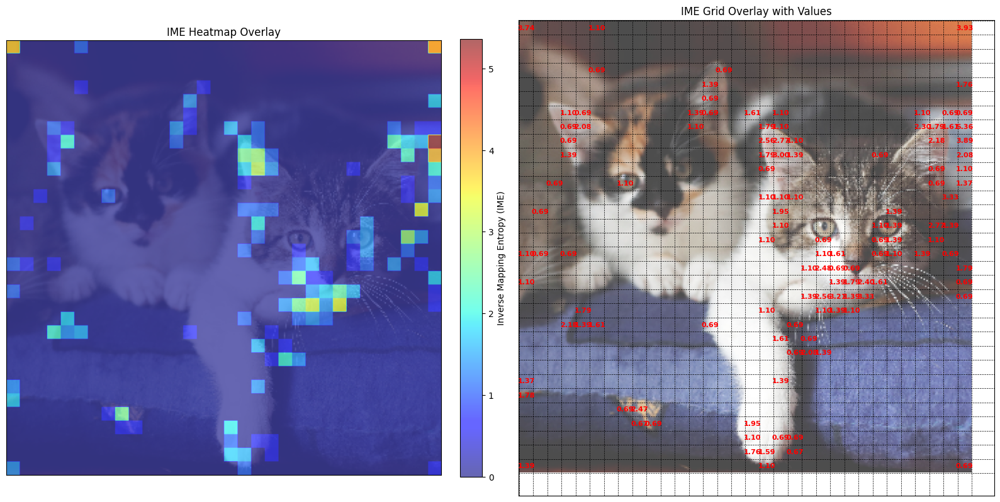

In [118]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Load the target image (assuming the user provides the correct path)
image_path_target = '/kaggle/input/catoos/Dataset_Cats/target_cat.jpeg'
target_img = cv2.imread(image_path_target)

# Check if image is successfully loaded
if target_img is not None:
    target_img = cv2.cvtColor(target_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

    # Resize image to match the 32x32 grid scale (assuming original is larger)
    img_size = 320  # Example target size (adjust if needed)
    target_img = cv2.resize(target_img, (img_size, img_size))

    # Resize IME grid to match image size for overlaying
    ime_resized = cv2.resize(ime_grid.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    # Create a side-by-side visualization: (1) Heatmap overlay (2) Numeric overlay on the image
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # --- First Plot: Heatmap Overlay ---
    axes[0].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[0].imshow(ime_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=ime_grid.max()))

    # Add color bar for heatmap
    fig.colorbar(heatmap, ax=axes[0], fraction=0.046, pad=0.04, label="Inverse Mapping Entropy (IME)")

    # Hide axis labels
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].set_title("IME Heatmap Overlay")

    # --- Second Plot: Numeric Grid Overlay ---
    axes[1].imshow(target_img, alpha=0.7)  # Target image with transparency

    # Overlay grid lines
    cell_size = img_size // grid_size
    for i in range(grid_size + 1):
        axes[1].axhline(i * cell_size, color='black', linestyle='--', linewidth=0.5)
        axes[1].axvline(i * cell_size, color='black', linestyle='--', linewidth=0.5)

    # Overlay IME values at each grid cell's center
    for i in range(grid_size):
        for j in range(grid_size):
            ime_value = ime_grid[i, j]
            if ime_value > 0:  # Only show nonzero values
                axes[1].text(j * cell_size + cell_size // 2,
                             i * cell_size + cell_size // 2,
                             f"{ime_value:.2f}",
                             color="red", fontsize=8, ha="center", va="center", fontweight="bold")

    # Remove axis ticks
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].set_title("IME Grid Overlay with Values")

    # Show the combined visualization
    plt.tight_layout()
    plt.show()
else:
    print("Error: Target image not found. Please upload the correct image.")


In [119]:
# Add Inverse Mapping Entropy (IME) column to organized_df

organized_df["Step 2 (Src → Tgt)"] = organized_df["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df["IME"] = organized_df["Step 2 (Src → Tgt)"].apply(lambda coord: ime_grid[coord[0], coord[1]])
organized_df["IME"] = organized_df["IME"].apply(lambda x: float(f"{x:.4f}"))  # Adjust decimal places as needed
display(organized_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608
1,"(0, 0)","(0, 1)","(7, 31)","(8, 7)",50.0,0.955474,1.488676,1827,5.3611
2,"(0, 0)","(1, 0)","(5, 31)","(2, 23)",265.0,0.887728,1.199465,6,-0.0000
3,"(0, 0)","(1, 1)","(8, 31)","(19, 8)",186.5,0.720260,1.339677,435,3.8893
4,"(0, 1)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.566962,49,1.7608
...,...,...,...,...,...,...,...,...,...
8831,"(31, 30)","(31, 31)","(30, 16)","(16, 25)",130.5,1.196654,1.164680,40,1.7552
8832,"(31, 31)","(30, 30)","(19, 22)","(14, 23)",152.5,0.000000,1.350712,219,3.2141
8833,"(31, 31)","(30, 31)","(30, 16)","(16, 25)",116.0,1.196654,0.725166,40,1.7552
8834,"(31, 31)","(31, 30)","(30, 16)","(16, 25)",125.0,1.196654,0.725166,40,1.7552


# Computing NIMS

In [120]:
# Initialize a 32x32 grid for NIMS values
nims_grid = np.zeros((32, 32), dtype=float)

# Compute NIMS for each target coordinate using the formula: NIMS(y) = IME(y) / log(MD(y))
for i in range(32):
    for j in range(32):
        md_value = md_grid[i, j]  # Mapping Density
        ime_value = ime_grid[i, j]  # IME

        # Ensure no division by zero; if MD is too low, return just IME
        if md_value > 1:
            nims_grid[i, j] = ime_value / np.log(md_value)
        else:
            nims_grid[i, j] = ime_value  # If MD is too low, return IME directly

# Convert NIMS grid to a DataFrame for easier visualization
nims_df = pd.DataFrame(nims_grid)


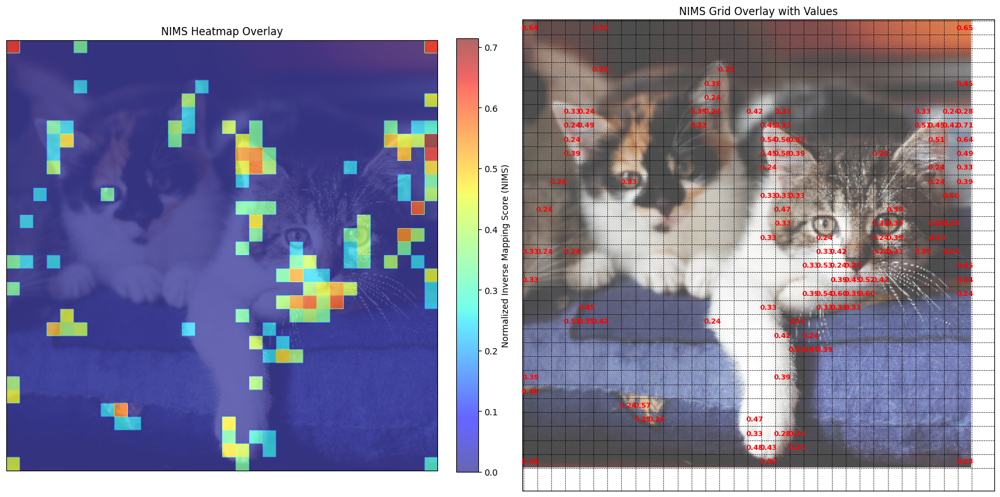

In [121]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Load the target image (ensure the correct path is provided)
image_path_target = '/kaggle/input/catoos/Dataset_Cats/target_cat.jpeg'
target_img = cv2.imread(image_path_target)

# Check if image is successfully loaded
if target_img is not None:
    target_img = cv2.cvtColor(target_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

    # Resize image to match the 32x32 grid scale (assuming original is larger)
    img_size = 320  # Example target size (adjust if needed)
    target_img = cv2.resize(target_img, (img_size, img_size))

    # Resize NIMS grid to match image size for overlaying
    nims_resized = cv2.resize(nims_grid.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    # Create a side-by-side visualization: (1) Heatmap overlay (2) Numeric overlay on the image
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # --- First Plot: Heatmap Overlay ---
    axes[0].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[0].imshow(nims_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=nims_grid.max()))

    # Add color bar for heatmap
    fig.colorbar(heatmap, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Inverse Mapping Score (NIMS)")

    # Hide axis labels
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].set_title("NIMS Heatmap Overlay")

    # --- Second Plot: Numeric Grid Overlay ---
    axes[1].imshow(target_img, alpha=0.7)  # Target image with transparency

    # Overlay grid lines
    cell_size = img_size // grid_size
    for i in range(grid_size + 1):
        axes[1].axhline(i * cell_size, color='black', linestyle='--', linewidth=0.5)
        axes[1].axvline(i * cell_size, color='black', linestyle='--', linewidth=0.5)

    # Overlay NIMS values at each grid cell's center
    for i in range(grid_size):
        for j in range(grid_size):
            nims_value = nims_grid[i, j]
            if nims_value > 0:  # Only show nonzero values
                axes[1].text(j * cell_size + cell_size // 2,
                             i * cell_size + cell_size // 2,
                             f"{nims_value:.2f}",
                             color="red", fontsize=8, ha="center", va="center", fontweight="bold")

    # Remove axis ticks
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].set_title("NIMS Grid Overlay with Values")

    # Show the combined visualization
    plt.tight_layout()
    plt.show()
else:
    print("Error: Target image not found. Please upload the correct image.")


In [122]:
# Add NIMS (Normalized Inverse Mapping Score) column to organized_df

organized_df["Step 2 (Src → Tgt)"] = organized_df["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df["NIMS"] = organized_df["Step 2 (Src → Tgt)"].apply(lambda coord: nims_grid[coord[0], coord[1]])
organized_df["NIMS"] = organized_df["NIMS"].apply(lambda x: float(f"{x:.4f}"))  # Adjust decimal places as needed

display(organized_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608,0.4524
1,"(0, 0)","(0, 1)","(7, 31)","(8, 7)",50.0,0.955474,1.488676,1827,5.3611,0.7138
2,"(0, 0)","(1, 0)","(5, 31)","(2, 23)",265.0,0.887728,1.199465,6,-0.0000,-0.0000
3,"(0, 0)","(1, 1)","(8, 31)","(19, 8)",186.5,0.720260,1.339677,435,3.8893,0.6402
4,"(0, 1)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.566962,49,1.7608,0.4524
...,...,...,...,...,...,...,...,...,...,...
8831,"(31, 30)","(31, 31)","(30, 16)","(16, 25)",130.5,1.196654,1.164680,40,1.7552,0.4758
8832,"(31, 31)","(30, 30)","(19, 22)","(14, 23)",152.5,0.000000,1.350712,219,3.2141,0.5964
8833,"(31, 31)","(30, 31)","(30, 16)","(16, 25)",116.0,1.196654,0.725166,40,1.7552,0.4758
8834,"(31, 31)","(31, 30)","(30, 16)","(16, 25)",125.0,1.196654,0.725166,40,1.7552,0.4758


# Side by Side visualization 

Text(0.5, 1.0, 'Mapping Density Heatmap Overlay')

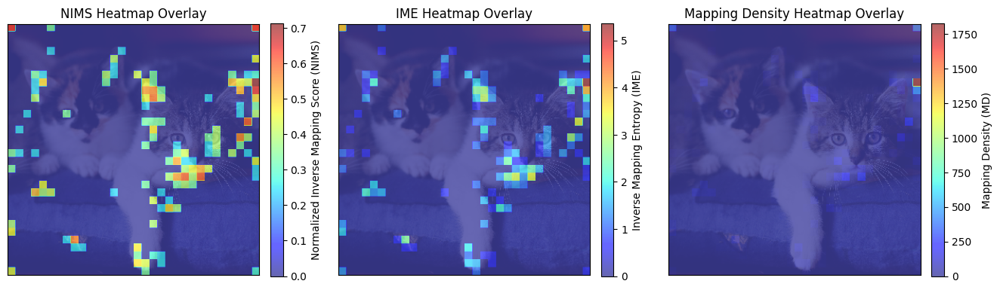

In [123]:
    # Resize NIMS grid to match image size for overlaying
    nims_resized = cv2.resize(nims_grid.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    # Create a side-by-side visualization: (1) Heatmap overlay (2) Numeric overlay on the image
    fig, axes = plt.subplots(1, 3, figsize=(16, 8))

    # --- First Plot: Heatmap Overlay ---
    axes[0].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[0].imshow(nims_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=nims_grid.max()))

    # Add color bar for heatmap
    fig.colorbar(heatmap, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Inverse Mapping Score (NIMS)")

    # Hide axis labels
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].set_title("NIMS Heatmap Overlay")

    # --- Second Plot: Heatmap Overlay ---
    axes[1].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[1].imshow(ime_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=ime_grid.max()))
    fig.colorbar(heatmap, ax=axes[1], fraction=0.046, pad=0.04, label="Inverse Mapping Entropy (IME)")

    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].set_title("IME Heatmap Overlay")

    # --- Third Plot: Heatmap Overlay ---
    axes[2].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[2].imshow(md_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=md_grid.max()))
    
    fig.colorbar(heatmap, ax=axes[2], fraction=0.046, pad=0.04, label="Mapping Density (MD)")
    
    # Hide axis labels
    axes[2].set_xticks([])
    axes[2].set_yticks([])
    axes[2].set_title("Mapping Density Heatmap Overlay")


In [124]:
display(organized_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608,0.4524
1,"(0, 0)","(0, 1)","(7, 31)","(8, 7)",50.0,0.955474,1.488676,1827,5.3611,0.7138
2,"(0, 0)","(1, 0)","(5, 31)","(2, 23)",265.0,0.887728,1.199465,6,-0.0000,-0.0000
3,"(0, 0)","(1, 1)","(8, 31)","(19, 8)",186.5,0.720260,1.339677,435,3.8893,0.6402
4,"(0, 1)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.566962,49,1.7608,0.4524
...,...,...,...,...,...,...,...,...,...,...
8831,"(31, 30)","(31, 31)","(30, 16)","(16, 25)",130.5,1.196654,1.164680,40,1.7552,0.4758
8832,"(31, 31)","(30, 30)","(19, 22)","(14, 23)",152.5,0.000000,1.350712,219,3.2141,0.5964
8833,"(31, 31)","(30, 31)","(30, 16)","(16, 25)",116.0,1.196654,0.725166,40,1.7552,0.4758
8834,"(31, 31)","(31, 30)","(30, 16)","(16, 25)",125.0,1.196654,0.725166,40,1.7552,0.4758


In [125]:
# Apply filtering conditions to select the best keypoints
filtered_df = organized_df[
    (organized_df["IME"] <= 2)  # Remove points where IME > 4
].copy()

display(filtered_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608,0.4524
2,"(0, 0)","(1, 0)","(5, 31)","(2, 23)",265.0,0.887728,1.199465,6,-0.0000,-0.0000
4,"(0, 1)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.566962,49,1.7608,0.4524
7,"(0, 1)","(1, 0)","(5, 31)","(2, 23)",265.0,0.887728,1.589617,6,-0.0000,-0.0000
9,"(0, 1)","(1, 2)","(4, 31)","(0, 0)",2.5,0.000000,0.566962,49,1.7608,0.4524
...,...,...,...,...,...,...,...,...,...,...
8830,"(31, 30)","(31, 30)","(30, 16)","(16, 25)",125.0,1.196654,1.164680,40,1.7552,0.4758
8831,"(31, 30)","(31, 31)","(30, 16)","(16, 25)",130.5,1.196654,1.164680,40,1.7552,0.4758
8833,"(31, 31)","(30, 31)","(30, 16)","(16, 25)",116.0,1.196654,0.725166,40,1.7552,0.4758
8834,"(31, 31)","(31, 30)","(30, 16)","(16, 25)",125.0,1.196654,0.725166,40,1.7552,0.4758


In [126]:
filtered_df = organized_df[
    (organized_df["IME"] <= 2)  &  # Keep IME in the range [3, 5]
    (organized_df["MSE (Src vs. Tgt→Src)"] < 50)  # Ensure MSE is less than 50
].copy()
display(filtered_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608,0.4524
4,"(0, 1)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.566962,49,1.7608,0.4524
9,"(0, 1)","(1, 2)","(4, 31)","(0, 0)",2.5,0.000000,0.566962,49,1.7608,0.4524
14,"(0, 2)","(1, 2)","(4, 31)","(0, 0)",2.5,0.955474,0.694387,49,1.7608,0.4524
15,"(0, 2)","(1, 3)","(4, 31)","(0, 0)",5.0,0.955474,0.694387,49,1.7608,0.4524
...,...,...,...,...,...,...,...,...,...,...
8813,"(31, 27)","(31, 28)","(30, 17)","(31, 31)",4.5,0.843625,1.026373,39,1.5911,0.4343
8814,"(31, 28)","(30, 27)","(30, 17)","(31, 31)",8.5,0.000000,0.957925,39,1.5911,0.4343
8817,"(31, 28)","(31, 27)","(30, 17)","(31, 31)",8.0,0.000000,0.957925,39,1.5911,0.4343
8818,"(31, 28)","(31, 28)","(30, 17)","(31, 31)",4.5,0.000000,0.957925,39,1.5911,0.4343


In [127]:
# Define the maximum allowed repeats for each unique (Step 1, Step 2, Step 3) triplet
max_repeats = 1  # Adjust this number as needed

# Identify duplicates and retain only the first `max_repeats` occurrences
filtered_df = filtered_df.groupby(["Step 1 (Src)", "Step 2 (Src → Tgt)", "Step 3 (Tgt → Src)"]).head(max_repeats).copy()

display(filtered_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(4, 31)","(0, 0)",0.0,0.000000,0.522475,49,1.7608,0.4524
9,"(0, 1)","(1, 2)","(4, 31)","(0, 0)",2.5,0.000000,0.566962,49,1.7608,0.4524
15,"(0, 2)","(1, 3)","(4, 31)","(0, 0)",5.0,0.955474,0.694387,49,1.7608,0.4524
21,"(0, 3)","(1, 4)","(4, 31)","(0, 0)",8.5,0.955474,0.793246,49,1.7608,0.4524
111,"(0, 18)","(1, 19)","(3, 14)","(3, 23)",10.0,1.046374,1.318685,18,0.6931,0.2398
...,...,...,...,...,...,...,...,...,...,...
8578,"(30, 23)","(31, 24)","(31, 31)","(31, 18)",18.0,2.141931,1.273052,12,0.6931,0.2789
8587,"(30, 24)","(31, 25)","(29, 18)","(31, 31)",18.0,1.302591,1.528953,12,0.6931,0.2789
8596,"(30, 25)","(31, 26)","(29, 18)","(31, 31)",12.5,2.081224,1.076378,12,0.6931,0.2789
8605,"(30, 26)","(31, 27)","(30, 17)","(31, 31)",8.0,0.383617,1.265077,39,1.5911,0.4343


In [128]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.cm as cm

def visualize_keypoints(filtered_df, source_image_path, target_image_path):
    """
    Visualizes keypoints across three steps:
    - Step 1 (Src) on the Source image
    - Step 2 (Src → Tgt) on the Target image
    - Step 3 (Tgt → Src) back on the Source image

    Parameters:
        filtered_df (pd.DataFrame): Filtered DataFrame containing keypoints.
        source_image_path (str): Path to the source image.
        target_image_path (str): Path to the target image.
    """

    # Load and resize images
    source_img = cv2.cvtColor(cv2.resize(cv2.imread(source_image_path), (320, 320)), cv2.COLOR_BGR2RGB)
    target_img = cv2.cvtColor(cv2.resize(cv2.imread(target_image_path), (320, 320)), cv2.COLOR_BGR2RGB)

    cmap = cm.get_cmap("tab10")  # Colormap for distinct colors

    # Group by unique Source points
    for source, group in filtered_df.groupby("Source"):
        src_coords = np.array([eval(str(x)) for x in group["Step 1 (Src)"]])
        inter_coords = np.array([eval(str(x)) for x in group["Step 2 (Src → Tgt)"]])
        trg_coords = np.array([eval(str(x)) for x in group["Step 3 (Tgt → Src)"]])

        # Get unique points and assign colors
        all_coords = np.vstack((src_coords, inter_coords, trg_coords))
        unique_points, indices = np.unique(all_coords, axis=0, return_inverse=True)
        colors = [cmap(i % 10) for i in indices]  # Assign a color per unique point

        # Plot the grids
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        titles = [f"Source [{source}]", "Step 2 (Target)", "Step 3 (Back to Source)"]
        images = [source_img, target_img, source_img]
        coords_list = [src_coords, inter_coords, trg_coords]

        for ax, img, coords, title in zip(axes, images, coords_list, titles):
            ax.imshow(img, alpha=0.4)  # Dim image for better visibility
            if coords.size:  # Only scatter if there are valid coordinates
                for i, (y, x) in enumerate(coords):
                    ax.scatter(x * 10, y * 10, color=colors[i], s=40, marker='x', edgecolors='black')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(title, fontsize=10)

        plt.tight_layout()
        plt.show()


In [129]:
source_image_path = '/kaggle/input/catoos/Dataset_Cats/source_cat.png'
target_image_path = '/kaggle/input/catoos/Dataset_Cats/target_cat.jpeg'

#visualize_keypoints(filtered_df, source_image_path,target_image_path )


In [130]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.cm as cm

def visualize_inverse_mapping(filtered_df, source_image_path, target_image_path):
    """
    Visualizes Step 1 (Src) points that map onto the same Step 2 (Src → Tgt) location.

    - Shows Step 2 (Src → Tgt) on the Target image.
    - Displays all corresponding Step 1 (Src) points on the Source image.

    Parameters:
        filtered_df (pd.DataFrame): Filtered DataFrame containing keypoints.
        source_image_path (str): Path to the source image.
        target_image_path (str): Path to the target image.
    """

    # Load and resize images
    source_img = cv2.cvtColor(cv2.resize(cv2.imread(source_image_path), (320, 320)), cv2.COLOR_BGR2RGB)
    target_img = cv2.cvtColor(cv2.resize(cv2.imread(target_image_path), (320, 320)), cv2.COLOR_BGR2RGB)

    cmap = cm.get_cmap("tab10")  # Colormap for distinct colors

    # Group by Step 2 (Src → Tgt)
    for step2, group in filtered_df.groupby("Step 2 (Src → Tgt)"):
        src_coords = np.array([eval(str(x)) for x in group["Step 1 (Src)"]])
        tgt_coord = eval(str(step2))  # Step 2 (Src → Tgt) is a single coordinate

        # Assign colors per source point
        colors = [cmap(i % 10) for i in range(len(src_coords))]

        # Plot the grids
        fig, axes = plt.subplots(1, 2, figsize=(8, 4))
        titles = [f"Step 1 (Src) Points (Mapped to {step2})", "Step 2 (Tgt) Location"]
        images = [source_img, target_img]

        # Step 1 (Src) Visualization on Source Image
        axes[0].imshow(source_img, alpha=0.4)
        for i, (y, x) in enumerate(src_coords):
            axes[0].scatter(x * 10, y * 10, color=colors[i], s=40, marker='x', edgecolors='black')
        axes[0].set_title(titles[0], fontsize=10)
        axes[0].set_xticks([])
        axes[0].set_yticks([])

        # Step 2 (Src → Tgt) Visualization on Target Image
        axes[1].imshow(target_img, alpha=0.4)
        axes[1].scatter(tgt_coord[1] * 10, tgt_coord[0] * 10, color="red", s=100, marker='o', edgecolors='black', label="Step 2 (Src → Tgt)")
        axes[1].legend()
        axes[1].set_title(titles[1], fontsize=10)
        axes[1].set_xticks([])
        axes[1].set_yticks([])

        plt.tight_layout()
        plt.show()


In [131]:
#visualize_inverse_mapping(filtered_df, source_image_path,target_image_path )


# Dataframe for Test 

In [132]:
dataset = [(i,j) for i in range(32) for j in range(32)]

argmax_results_2, kl_dict_2, trace_results_2 = entire_pass(
    averaged_map_target, 
    averaged_map_target_to_source, 
    averaged_map_source_to_target, 
    dataset
)

mse_results_2 = compute_mse(trace_results_2)

# Apply the function safely
organized_df_2["Step 1 (Src)"] = organized_df_2["Step 1 (Src)"].apply(parse_tuple)
organized_df_2["Step 2 (Src → Tgt)"] = organized_df_2["Step 2 (Src → Tgt)"].apply(parse_tuple)

# Initialize a 32x32 grid for Mapping Density (MD)
md_grid_2 = np.zeros((32, 32), dtype=int)

# Count occurrences of each target point
for target in organized_df_2["Step 2 (Src → Tgt)"]:
    x, y = target  # Target coordinates
    md_grid_2[x, y] += 1  # Increment count

# Convert to a DataFrame for easy visualization
md_df_2 = pd.DataFrame(md_grid_2)

# Add Mapping Density (MD) column to organized_df
organized_df_2["Step 2 (Src → Tgt)"] = organized_df_2["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df_2["MD Density"] = organized_df_2["Step 2 (Src → Tgt)"].apply(lambda coord: md_grid_2[coord[0], coord[1]])

# Initialize a 32x32 grid for IME values
ime_grid_2 = np.zeros((32, 32), dtype=float)

# Dictionary to store source counts per target point
mapping_counts_2 = {}

# Step 1: Count occurrences of each (Src → Tgt) mapping
for _, row in organized_df_2.iterrows():
    source = row["Step 1 (Src)"]
    target = row["Step 2 (Src → Tgt)"]
    
    if target not in mapping_counts_2:
        mapping_counts_2[target] = {}
    if source not in mapping_counts_2[target]:
        mapping_counts_2[target][source] = 0
    
    mapping_counts_2[target][source] += 1

# Step 2: Compute probability distributions P(S_i | T_j)
mapping_probs_2 = {}
for target, source_counts in mapping_counts_2.items():
    total_mappings = sum(source_counts.values())
    mapping_probs_2[target] = {src: count / total_mappings for src, count in source_counts.items()}

# Step 3: Compute entropy H(T_j) for each target
for target, prob_dist in mapping_probs_2.items():
    entropy = -sum(p * np.log(p + 1e-8) for p in prob_dist.values())  # Compute entropy
    x, y = target  # Extract grid coordinates
    ime_grid_2[x, y] = entropy  # Assign entropy value to the corresponding grid location

# Convert IME grid to a DataFrame for easier visualization
ime_df_2 = pd.DataFrame(ime_grid_2)

organized_df_2["Step 2 (Src → Tgt)"] = organized_df_2["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df_2["IME"] = organized_df_2["Step 2 (Src → Tgt)"].apply(lambda coord: ime_grid_2[coord[0], coord[1]])
organized_df_2["IME"] = organized_df_2["IME"].apply(lambda x: float(f"{x:.4f}"))  # Adjust decimal places as needed

# Initialize a 32x32 grid for NIMS values
nims_grid_2 = np.zeros((32, 32), dtype=float)

# Compute NIMS for each target coordinate using the formula: NIMS(y) = IME(y) / log(MD(y))
for i in range(32):
    for j in range(32):
        md_value = md_grid_2[i, j]  # Mapping Density
        ime_value = ime_grid_2[i, j]  # IME

        # Ensure no division by zero; if MD is too low, return just IME
        if md_value > 1:
            nims_grid_2[i, j] = ime_value / np.log(md_value)
        else:
            nims_grid_2[i, j] = ime_value  # If MD is too low, return IME directly

# Convert NIMS grid to a DataFrame for easier visualization
nims_df_2 = pd.DataFrame(nims_grid_2)

organized_df_2["Step 2 (Src → Tgt)"] = organized_df_2["Step 2 (Src → Tgt)"].apply(parse_tuple)
organized_df_2["NIMS"] = organized_df_2["Step 2 (Src → Tgt)"].apply(lambda coord: nims_grid_2[coord[0], coord[1]])
organized_df_2["NIMS"] = organized_df_2["NIMS"].apply(lambda x: float(f"{x:.4f}"))  # Adjust decimal places as needed

In [151]:
display(organized_df_2)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
0,"(0, 0)","(0, 0)","(0, 31)","(0, 31)",480.5,0.000000,0.525429,68,2.1535,0.5104
1,"(0, 0)","(0, 1)","(0, 24)","(0, 0)",0.5,0.407306,0.315726,30,1.3662,0.4017
2,"(0, 0)","(1, 0)","(0, 24)","(0, 0)",0.5,0.407306,0.315726,30,1.3662,0.4017
3,"(0, 0)","(1, 1)","(0, 24)","(0, 0)",1.0,0.407306,0.315726,30,1.3662,0.4017
4,"(0, 1)","(0, 0)","(0, 31)","(0, 31)",480.5,0.000000,0.659618,68,2.1535,0.5104
...,...,...,...,...,...,...,...,...,...,...
8831,"(31, 30)","(31, 31)","(31, 18)","(30, 19)",72.5,2.069513,1.371840,58,2.0450,0.5036
8832,"(31, 31)","(30, 30)","(31, 23)","(31, 31)",1.0,0.000000,1.234182,27,1.0986,0.3333
8833,"(31, 31)","(30, 31)","(31, 19)","(28, 8)",266.5,0.607020,1.727270,24,1.0822,0.3405
8834,"(31, 31)","(31, 30)","(31, 17)","(31, 10)",200.0,2.543093,1.989479,36,1.5890,0.4434


Text(0.5, 1.0, 'Mapping Density Heatmap Overlay')

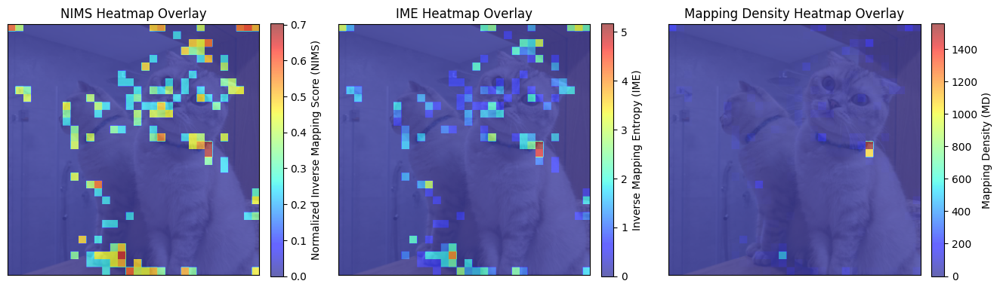

In [133]:

    target_img_path = '/kaggle/input/catoos/Dataset_Cats/source_cat.png'
    target_img = cv2.imread(target_img_path)
    target_img = cv2.cvtColor(target_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    
    
    # Resize image to match the 32x32 grid scale (assuming original is larger)
    img_size = 320  # Example target size (adjust if needed)
    grid_size = 32
    cell_size = 320//32
    target_img = cv2.resize(target_img, (img_size, img_size))

    # Resize NIMS grid to match image size for overlaying
    nims_resized = cv2.resize(nims_grid_2.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)
    ime_resized = cv2.resize(ime_grid_2.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)
    md_resized = cv2.resize(md_grid_2.astype(float), (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    # Create a side-by-side visualization: (1) Heatmap overlay (2) Numeric overlay on the image
    fig, axes = plt.subplots(1, 3, figsize=(16, 8))

    # --- First Plot: Heatmap Overlay ---
    axes[0].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[0].imshow(nims_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=nims_grid_2.max()))

    # Add color bar for heatmap
    fig.colorbar(heatmap, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Inverse Mapping Score (NIMS)")

    # Hide axis labels
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].set_title("NIMS Heatmap Overlay")

    # --- Second Plot: Heatmap Overlay ---
    axes[1].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[1].imshow(ime_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=ime_grid_2.max()))
    fig.colorbar(heatmap, ax=axes[1], fraction=0.046, pad=0.04, label="Inverse Mapping Entropy (IME)")

    axes[1].set_xticks([])
    axes[1].set_yticks([])
    axes[1].set_title("IME Heatmap Overlay")

    # --- Third Plot: Heatmap Overlay ---
    axes[2].imshow(target_img, alpha=0.5)  # Target image with transparency
    heatmap = axes[2].imshow(md_resized, cmap="jet", alpha=0.6, norm=mcolors.Normalize(vmin=0, vmax=md_grid_2.max()))
    
    fig.colorbar(heatmap, ax=axes[2], fraction=0.046, pad=0.04, label="Mapping Density (MD)")
    
    # Hide axis labels
    axes[2].set_xticks([])
    axes[2].set_yticks([])
    axes[2].set_title("Mapping Density Heatmap Overlay")


# Dataframe for Keypoints 


In [134]:
# Define the keypoint coordinates of interest
slices_of_interest = [(5, 20), (5, 21), (5, 22), (5, 23), (4, 20), (4, 21), (4, 22),
                      (8, 28), (8, 29), (8, 27), (7, 27), (9, 28),
                      (8,20),(7,20),(7,21),(8,21),(10,24),(10,25),(9,24),
                      (8, 9), (8, 10), (7, 9),
                      (30, 11), (30, 12), (30, 13), (29, 13)]

# Create a smaller DataFrame containing only the rows where Step 2 (Src → Tgt) is in slices_of_interest
keypoint_df = organized_df[organized_df["Source"].isin(slices_of_interest)].copy()

display(keypoint_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
1211,"(4, 20)","(3, 19)","(3, 13)","(15, 25)",90.0,0.000000,1.497875,9,-0.0000,-0.0000
1212,"(4, 20)","(3, 20)","(7, 17)","(7, 27)",32.5,0.681858,0.856973,54,1.7918,0.4492
1213,"(4, 20)","(3, 21)","(7, 28)","(6, 18)",9.0,1.057279,0.870230,90,2.3026,0.5117
1214,"(4, 20)","(4, 19)","(6, 28)","(3, 22)",5.0,1.142001,1.858339,27,1.0986,0.3333
1215,"(4, 20)","(4, 20)","(8, 17)","(11, 17)",29.0,1.540074,0.903633,114,2.5603,0.5406
...,...,...,...,...,...,...,...,...,...,...
8484,"(30, 13)","(30, 13)","(20, 24)","(14, 8)",140.5,1.331759,1.761305,9,-0.0000,-0.0000
8485,"(30, 13)","(30, 14)","(18, 30)","(15, 27)",197.0,1.926380,1.117235,9,-0.0000,-0.0000
8486,"(30, 13)","(31, 12)","(27, 8)","(23, 31)",212.5,0.000000,3.668249,78,2.4714,0.5673
8487,"(30, 13)","(31, 13)","(27, 9)","(8, 28)",377.0,0.194806,3.200654,6,-0.0000,-0.0000


In [135]:
#visualize_keypoints(keypoint_df, source_image_path,target_image_path )

In [136]:
filtered_df = keypoint_df[
    (keypoint_df["IME"] <= 2) &
    (keypoint_df["MSE (Src vs. Tgt→Src)"] < 20)
].copy()
display(filtered_df)


,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
1214,"(4, 20)","(4, 19)","(6, 28)","(3, 22)",5.0,1.142001,1.858339,27,1.0986,0.3333
1231,"(4, 22)","(3, 23)","(6, 30)","(3, 22)",0.5,1.894897,2.409578,18,0.6931,0.2398
1234,"(4, 22)","(4, 23)","(7, 18)","(6, 26)",6.5,0.753465,0.913871,27,1.0986,0.3333
1493,"(5, 20)","(4, 19)","(6, 28)","(3, 22)",5.0,0.000000,2.959563,27,1.0986,0.3333
1500,"(5, 20)","(6, 20)","(13, 26)","(9, 21)",5.0,3.617238,1.890651,36,1.3863,0.3869
...,...,...,...,...,...,...,...,...,...,...
8474,"(30, 12)","(30, 11)","(20, 23)","(30, 11)",0.0,1.305032,1.039920,27,1.0986,0.3333
8475,"(30, 12)","(30, 12)","(28, 8)","(29, 10)",2.5,0.863559,1.071342,15,0.6730,0.2485
8482,"(30, 13)","(29, 14)","(15, 30)","(29, 14)",0.0,3.688030,0.818118,9,-0.0000,-0.0000
8483,"(30, 13)","(30, 12)","(28, 8)","(29, 10)",2.5,0.948856,2.187902,15,0.6730,0.2485


In [137]:
#visualize_keypoints(filtered_df, source_image_path,target_image_path )

In [138]:
# Define the keypoint coordinates of interest
slices_of_interest = [(3,i) for i in range(32)]

# Create a smaller DataFrame containing only the rows where Step 2 (Src → Tgt) is in slices_of_interest
normal_df = organized_df[organized_df["Source"].isin(slices_of_interest)].copy()

display(normal_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
752,"(3, 0)","(2, 0)","(6, 31)","(3, 23)",265.0,0.000000,0.621065,12,0.6931,0.2789
753,"(3, 0)","(2, 1)","(8, 31)","(19, 8)",169.0,0.563318,0.843408,435,3.8893,0.6402
754,"(3, 0)","(3, 0)","(6, 31)","(3, 23)",264.5,0.000000,0.621065,12,0.6931,0.2789
755,"(3, 0)","(3, 1)","(7, 31)","(8, 7)",30.5,0.550608,0.865587,1827,5.3611,0.7138
756,"(3, 0)","(4, 0)","(7, 31)","(8, 7)",32.5,0.550608,0.865587,1827,5.3611,0.7138
...,...,...,...,...,...,...,...,...,...,...
1029,"(3, 31)","(2, 31)","(0, 0)","(0, 31)",2.0,0.501297,0.977968,333,3.7424,0.6443
1030,"(3, 31)","(3, 30)","(0, 0)","(0, 31)",5.0,0.501297,0.977968,333,3.7424,0.6443
1031,"(3, 31)","(3, 31)","(0, 0)","(0, 31)",4.5,0.501297,0.977968,333,3.7424,0.6443
1032,"(3, 31)","(4, 30)","(0, 0)","(0, 31)",8.5,0.501297,0.977968,333,3.7424,0.6443


In [ ]:
visualize_keypoints(normal_df, source_image_path,target_image_path )

In [140]:

filt_df = normal_df[
    (normal_df["IME"] <= 2) &
    (normal_df["MSE (Src vs. Tgt→Src)"] < 20)
].copy()
display(filt_df)


,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
901,"(3, 16)","(4, 17)","(5, 19)","(4, 18)",0.5,1.178162,1.217209,9,-0.0000,-0.0000
909,"(3, 17)","(4, 17)","(5, 19)","(4, 18)",0.5,1.178162,0.918035,9,-0.0000,-0.0000
910,"(3, 17)","(4, 18)","(6, 19)","(5, 17)",1.0,1.475018,1.429382,9,-0.0000,-0.0000
917,"(3, 18)","(4, 17)","(5, 19)","(4, 18)",0.5,1.178162,0.578847,9,-0.0000,-0.0000
918,"(3, 18)","(4, 18)","(6, 19)","(5, 17)",1.0,1.475018,1.217955,9,-0.0000,-0.0000
919,"(3, 18)","(4, 19)","(6, 28)","(3, 22)",5.0,0.978145,1.019027,27,1.0986,0.3333
926,"(3, 19)","(4, 18)","(6, 19)","(5, 17)",1.0,1.475018,1.122047,9,-0.0000,-0.0000
927,"(3, 19)","(4, 19)","(6, 28)","(3, 22)",5.0,0.978145,0.871684,27,1.0986,0.3333
931,"(3, 20)","(2, 21)","(6, 30)","(3, 22)",1.0,0.480483,1.261443,18,0.6931,0.2398
935,"(3, 20)","(4, 19)","(6, 28)","(3, 22)",5.0,0.978145,1.111745,27,1.0986,0.3333


In [141]:
# Define the maximum allowed repeats for each unique (Step 1, Step 2, Step 3) triplet
max_repeats = 1  # Adjust this number as needed

# Identify duplicates and retain only the first `max_repeats` occurrences
filt_df = filt_df.groupby(["Step 1 (Src)", "Step 2 (Src → Tgt)", "Step 3 (Tgt → Src)"]).head(max_repeats).copy()

display(filt_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),MD Density,IME,NIMS
901,"(3, 16)","(4, 17)","(5, 19)","(4, 18)",0.5,1.178162,1.217209,9,-0.0000,-0.0000
910,"(3, 17)","(4, 18)","(6, 19)","(5, 17)",1.0,1.475018,1.429382,9,-0.0000,-0.0000
919,"(3, 18)","(4, 19)","(6, 28)","(3, 22)",5.0,0.978145,1.019027,27,1.0986,0.3333
931,"(3, 20)","(2, 21)","(6, 30)","(3, 22)",1.0,0.480483,1.261443,18,0.6931,0.2398
952,"(3, 22)","(3, 23)","(6, 30)","(3, 22)",0.5,0.000000,0.194917,18,0.6931,0.2398
955,"(3, 22)","(4, 23)","(7, 18)","(6, 26)",6.5,2.327498,2.209464,27,1.0986,0.3333
961,"(3, 23)","(3, 24)","(3, 14)","(3, 23)",0.5,1.085627,0.820269,18,0.6931,0.2398
964,"(3, 23)","(4, 24)","(4, 14)","(4, 24)",0.0,0.837798,1.489210,9,-0.0000,-0.0000
973,"(3, 24)","(4, 25)","(6, 3)","(7, 27)",6.5,2.381646,2.349441,27,1.0986,0.3333
976,"(3, 25)","(2, 26)","(4, 15)","(1, 28)",2.5,0.565201,0.394560,9,-0.0000,-0.0000


In [142]:
print(len(filt_df))

15


In [ ]:
visualize_keypoints(filt_df, source_image_path,target_image_path )


In [144]:

def extract_step1_tuples(filt_df: pd.DataFrame) -> list:
    """
    Extracts the 'Step 1 (Src)' column from the given DataFrame and returns it as a list of tuples.
    
    :param filt_df: A pandas DataFrame containing the relevant columns.
    :return: A list of tuples representing 'Step 1 (Src)'.
    """
    return filt_df['Step 2 (Src → Tgt)'].tolist()

second_pass = extract_step1_tuples(filt_df)

In [145]:
argmax_results, kl_dict, trace_results = entire_pass(
    averaged_map_target, 
    averaged_map_target_to_source, 
    averaged_map_source_to_target, 
    second_pass
)

In [146]:
mse_results = compute_mse(trace_results)
organized_df = organize_results(trace_results, mse_results, kl_dict)
# Apply the function safely
organized_df["Step 1 (Src)"] = organized_df["Step 1 (Src)"].apply(parse_tuple)
organized_df["Step 2 (Src → Tgt)"] = organized_df["Step 2 (Src → Tgt)"].apply(parse_tuple)


In [147]:
filtered_df = organized_df[(organized_df["MSE (Src vs. Tgt→Src)"] < 20)
].copy()
display(filtered_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src)
4,"(5, 19)","(5, 19)","(4, 18)","(6, 19)",0.5,1.624062,0.783611
5,"(5, 19)","(5, 20)","(4, 18)","(6, 19)",1.0,1.624062,0.783611
7,"(5, 19)","(6, 19)","(5, 17)","(6, 18)",0.5,1.761293,1.048247
8,"(5, 19)","(6, 20)","(5, 17)","(6, 18)",2.0,1.761293,1.048247
10,"(6, 19)","(5, 19)","(4, 18)","(6, 19)",0.5,0.803437,0.793484
11,"(6, 19)","(5, 20)","(4, 18)","(6, 19)",1.0,0.803437,0.793484
13,"(6, 19)","(6, 19)","(5, 17)","(6, 18)",0.5,0.683785,0.858484
14,"(6, 19)","(6, 20)","(5, 17)","(6, 18)",2.0,0.683785,0.858484
15,"(6, 19)","(7, 18)","(6, 26)","(7, 17)",0.5,2.413572,4.026789
16,"(6, 19)","(7, 19)","(5, 25)","(7, 18)",0.5,1.658293,2.863270


In [148]:
# Define the maximum allowed repeats for each unique (Step 1, Step 2, Step 3) triplet
max_repeats = 1  # Adjust this number as needed

# Identify duplicates and retain only the first `max_repeats` occurrences
filtered_df = filtered_df.groupby(["Step 1 (Src)", "Step 2 (Src → Tgt)", "Step 3 (Tgt → Src)"]).head(max_repeats).copy()

display(filtered_df)

,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src)
4,"(5, 19)","(5, 19)","(4, 18)","(6, 19)",0.5,1.624062,0.783611
5,"(5, 19)","(5, 20)","(4, 18)","(6, 19)",1.0,1.624062,0.783611
7,"(5, 19)","(6, 19)","(5, 17)","(6, 18)",0.5,1.761293,1.048247
8,"(5, 19)","(6, 20)","(5, 17)","(6, 18)",2.0,1.761293,1.048247
15,"(6, 19)","(7, 18)","(6, 26)","(7, 17)",0.5,2.413572,4.026789
16,"(6, 19)","(7, 19)","(5, 25)","(7, 18)",0.5,1.658293,2.863270
17,"(6, 19)","(7, 20)","(7, 14)","(6, 18)",2.5,1.116413,1.052282
21,"(6, 28)","(6, 27)","(0, 0)","(4, 31)",10.0,1.040134,1.224875
22,"(6, 28)","(6, 28)","(3, 22)","(7, 31)",5.0,1.888755,0.512089
23,"(6, 28)","(6, 29)","(3, 22)","(7, 31)",2.5,1.888755,0.512089


In [154]:
import pandas as pd

# Ensure filtered_df and organized_df_2 are available before proceeding
try:
    # Extract only the NIMS values for matching Step 1, Step 2, and Step 3 coordinates
    filtered_df_with_nims = filtered_df.copy()
    filtered_df_with_nims["IME"] = filtered_df.apply(
        lambda row: organized_df_2.loc[
            (organized_df_2["Step 1 (Src)"] == row["Step 1 (Src)"]) &
            (organized_df_2["Step 2 (Src → Tgt)"] == row["Step 2 (Src → Tgt)"]) &
            (organized_df_2["Step 3 (Tgt → Src)"] == row["Step 3 (Tgt → Src)"]),
            "IME"
        ].values[0] if not organized_df_2.loc[
            (organized_df_2["Step 1 (Src)"] == row["Step 1 (Src)"]) &
            (organized_df_2["Step 2 (Src → Tgt)"] == row["Step 2 (Src → Tgt)"]) &
            (organized_df_2["Step 3 (Tgt → Src)"] == row["Step 3 (Tgt → Src)"]),
            "IME"
        ].empty else None,
        axis=1
    )
    display(filtered_df_with_nims)
    
except NameError:
    print("Please re-upload `filtered_df` and `organized_df_2` so I can process the data.")


,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),IME
4,"(5, 19)","(5, 19)","(4, 18)","(6, 19)",0.5,1.624062,0.783611,0.6931
5,"(5, 19)","(5, 20)","(4, 18)","(6, 19)",1.0,1.624062,0.783611,0.6931
7,"(5, 19)","(6, 19)","(5, 17)","(6, 18)",0.5,1.761293,1.048247,2.0794
8,"(5, 19)","(6, 20)","(5, 17)","(6, 18)",2.0,1.761293,1.048247,2.0794
15,"(6, 19)","(7, 18)","(6, 26)","(7, 17)",0.5,2.413572,4.026789,-0.0000
16,"(6, 19)","(7, 19)","(5, 25)","(7, 18)",0.5,1.658293,2.863270,-0.0000
17,"(6, 19)","(7, 20)","(7, 14)","(6, 18)",2.5,1.116413,1.052282,0.6931
21,"(6, 28)","(6, 27)","(0, 0)","(4, 31)",10.0,1.040134,1.224875,3.0808
22,"(6, 28)","(6, 28)","(3, 22)","(7, 31)",5.0,1.888755,0.512089,2.0794
23,"(6, 28)","(6, 29)","(3, 22)","(7, 31)",2.5,1.888755,0.512089,2.0794


In [155]:
print(len(filtered_df))
final_df = filtered_df_with_nims[
    (filtered_df_with_nims["IME"] <= 2)].copy()
display(c)

34


,Source,Step 1 (Src),Step 2 (Src → Tgt),Step 3 (Tgt → Src),MSE (Src vs. Tgt→Src),KL (Ref || Tgt→Src),KL (Tgt→Src || Src),IME
4,"(5, 19)","(5, 19)","(4, 18)","(6, 19)",0.5,1.624062,0.783611,0.6931
5,"(5, 19)","(5, 20)","(4, 18)","(6, 19)",1.0,1.624062,0.783611,0.6931
15,"(6, 19)","(7, 18)","(6, 26)","(7, 17)",0.5,2.413572,4.026789,-0.0000
16,"(6, 19)","(7, 19)","(5, 25)","(7, 18)",0.5,1.658293,2.863270,-0.0000
17,"(6, 19)","(7, 20)","(7, 14)","(6, 18)",2.5,1.116413,1.052282,0.6931
25,"(6, 28)","(7, 28)","(6, 18)","(7, 28)",0.0,3.452628,2.869118,-0.0000
32,"(6, 30)","(6, 31)","(3, 23)","(6, 30)",0.5,1.120428,0.497386,1.0822
35,"(6, 30)","(7, 31)","(8, 7)","(7, 31)",0.0,3.383662,0.888247,-0.0000
39,"(7, 18)","(7, 17)","(7, 27)","(8, 18)",1.0,2.854722,1.517079,1.0986
42,"(7, 18)","(8, 17)","(11, 17)","(9, 17)",0.5,2.596990,2.140459,-0.0000


In [156]:
print(len(final_df))

24


<ipython-input-128-4afd69eca7dc>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab10")  # Colormap for distinct colors
<ipython-input-128-4afd69eca7dc>:46: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(x * 10, y * 10, color=colors[i], s=40, marker='x', edgecolors='black')


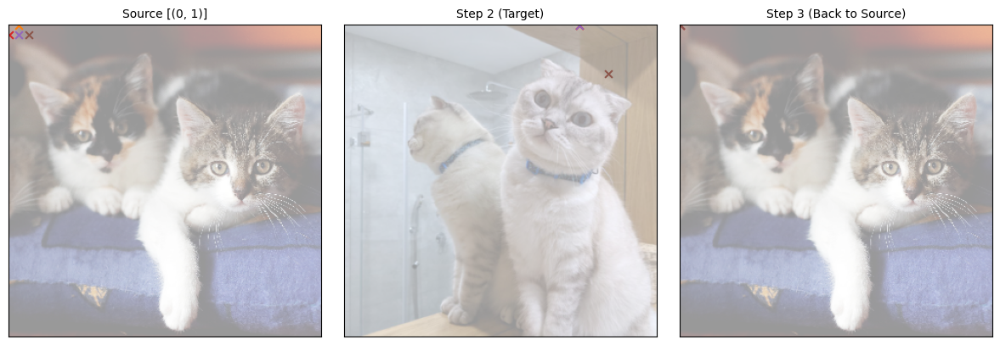

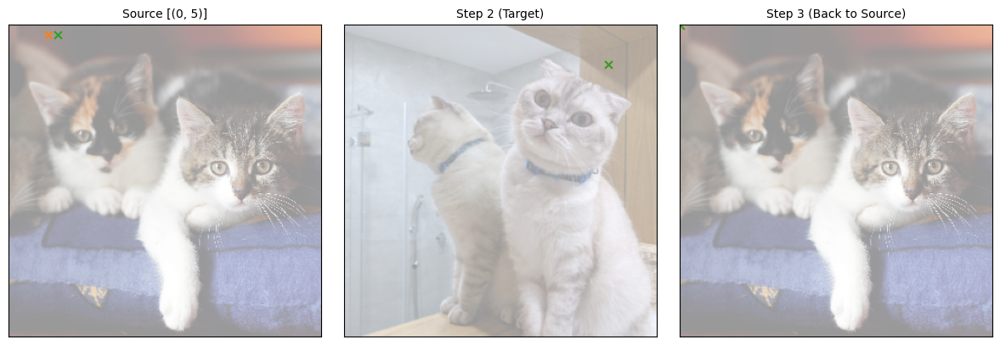

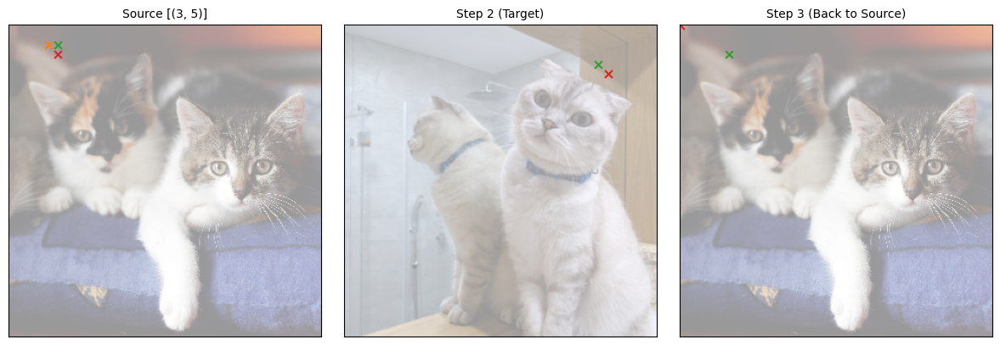

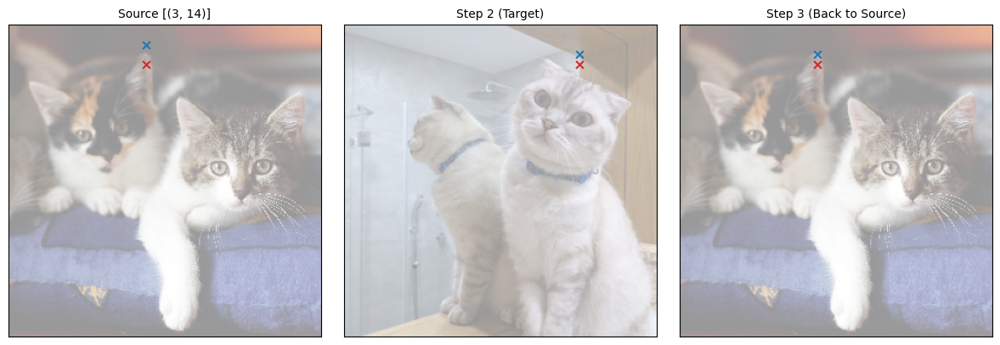

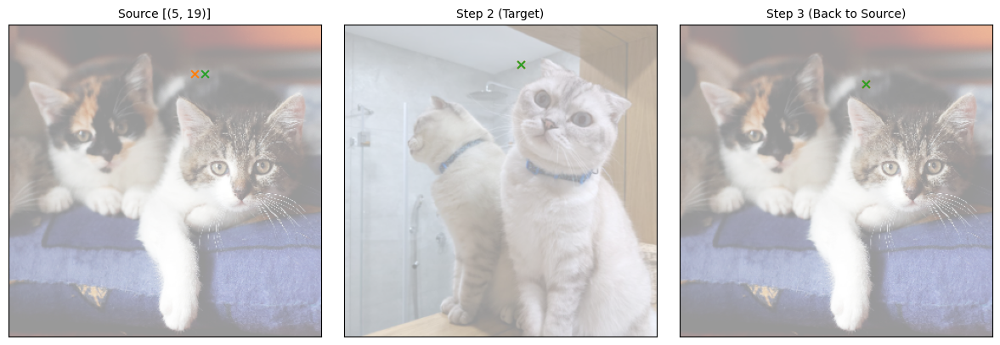

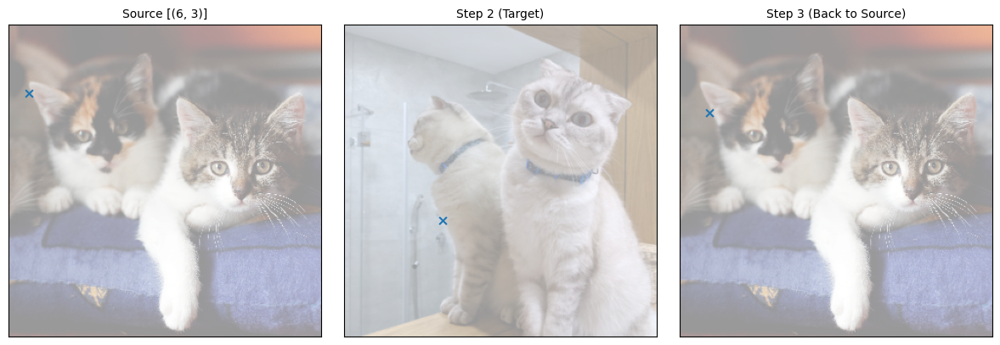

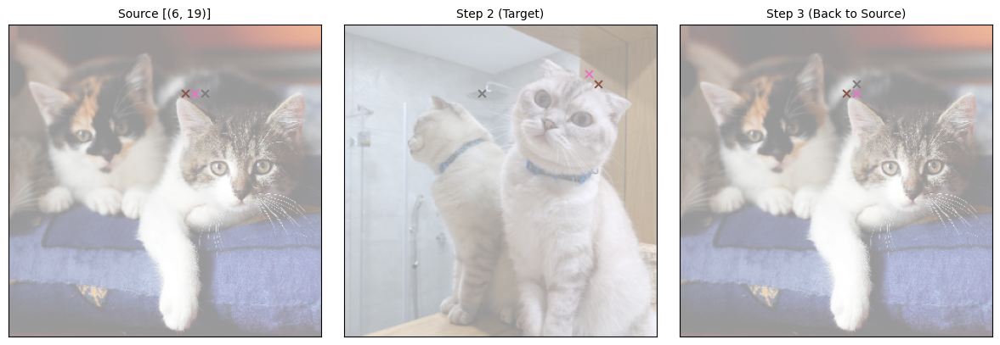

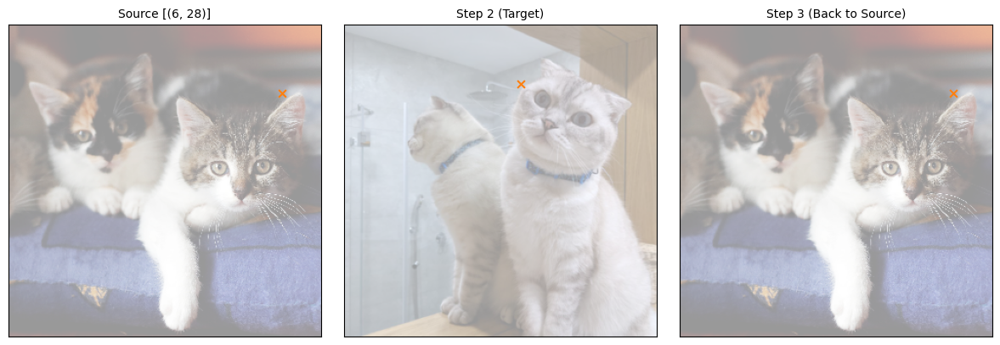

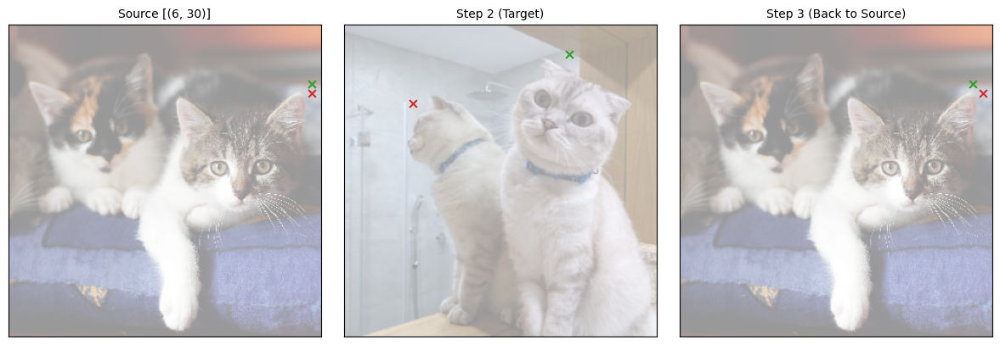

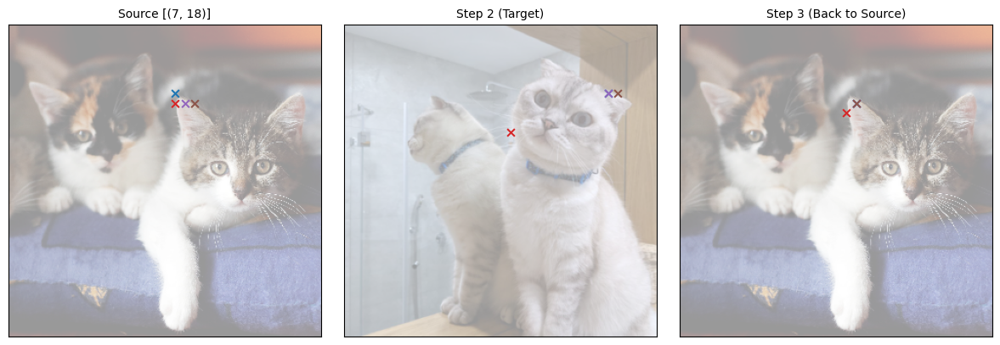

In [159]:
visualize_keypoints(final_df, target_image_path,source_image_path )